## Heart Attack Prediction Model - Sprint 1 Loading_Preprocessing_PreliminaryEDA

___
## Author: Will Wu

## Date: 2025-02-28
---

## **Table of Contents** ##

1. [Data Dictionary](#1)
2. [Loading and Setup](#2)
3. [Data Preprocessing - Stage 1](#3)
    - [Data Quality Check](#3a)
    - [Data Cleaning - Stage 1](#3b)
    - [Dealing with Missing Values - Stage 1](#3c)
        - [Missing Values in Target Variable](#3c1)
        - [Missing Values in Height/Weight/BMI](#3c2)
        - [Missing Values in Rows](#3c3)
        - [Missing Values in Columns](#3c4)
4. [Preliminary EDA](#4)
    - [Numeric Variables](#4a)
    - [Categorical Variables](#4b)
    - [Value Created](#4c)
5.  [In-Depth EDA](#5)
    - [Missing Values Analysis](#5a)
    - [In-Depth Feature Analysis](#5b)
6. [Data Preprocessing - Stage 2](#6)
    - [Dealing with Missing Values - Stage 2](#6a)
---

## 1. Data Dictionary <a class="anchor" id="1"></a>


The dataset originally comes from the CDC and is a major part of the Behavioral Risk Factor Surveillance System (BRFSS), which conducts annual telephone surveys to collect data on the health status of U.S. residents. This dataset contains 2022 annual CDC survey data of 400k+ adults related to their health status. The values within each column reflects the respondent's answer to corresponding question.<br>
Refer to the tables below for details regarding the data:
#### Interviewee's Basic Information
| Variable                     | Description                                         | Data Type     |
|:----------------------------:|:---------------------------------------------------:|:-------------:|
| `sex`                        | Sex of respondent                                   | Categorical   |
| `race_ethnicity_category`    | Race/ethnicity category                             | Categorical   |
| `age_category`               | Age category                                       | Categorical   |
| `state`                      | States in U.S. where respondent resides            | Categorical   |
| `height`          | Reported height in meters                           | Numeric       |
| `weight`       | Reported weight in kilograms                        | Numeric       |
| `bmi`                        | Body Mass Index                                     | Numeric       |

#### Health and Lifestyle Information
| Variable                     | Description                                         | Data Type     |
|:----------------------------:|:---------------------------------------------------:|:-------------:|
| `sleep_hours`               | Average sleep hours in a 24-hour period            | Numeric       |
| `alcohol_drinkers`          | Adults who reported at least one drink in 30 days | Categorical   |
| `general_health`            | Respondent's general health condition                | Categorical   |
| `smoker_status`             | Respondent's smoking status                         | Categorical   |
| `e_cigarette_usage`         | Respondent's e-cigarette usage status              | Categorical   |
| `physical_activities`       | Participation in physical activities in the past month              | Categorical   |
| `physical_health_days`      | Poor physical health days in past 30 days         | Categorical   |
| `mental_health_days`        | Poor mental health days in past 30 days           | Categorical   |

#### Medical History:<br>
| Variable                     | Description                                         | Data Type     |
|:----------------------------:|:---------------------------------------------------:|:-------------:|
| `had_angina`                | (Ever told) had angina or coronary heart disease?  | Categorical   |
| `had_stroke`                | (Ever told) had a stroke                           | Categorical   |
| `had_asthma`                | (Ever told) had asthma                             | Categorical   |
| `had_skin_cancer`           | (Ever told) had non-melanoma skin cancer          | Categorical   |
| `had_copd`                  | (Ever told) had COPD or related diseases           | Categorical   |
| `had_diabetes`              | (Ever told) had diabetes                           | Categorical   |
| `had_kidney_disease`        | (Ever told) had kidney disease (not stones)       | Categorical   |
| `had_depressive_disorder`    | (Ever told) had a depressive disorder              | Categorical   |
| `had_arthritis`              | (Ever told) had some form of arthritis             | Categorical   |
| `deaf_or_hard_of_hearing`   | Deaf or serious difficulty hearing                  | Categorical   |
| `blind_or_vision_difficulty` | Blind or serious difficulty seeing                  | Categorical   |
| `difficulty_walking`        | Serious difficulty walking or climbing stairs       | Categorical   |
| `difficulty_concentrating`   | Difficulty concentrating due to physical or mental conditions | Categorical   |
| `difficulty_dressing_bathing`| Difficulty dressing or bathing                      | Categorical   |
| `difficulty_errands`        | Difficulty doing errands due to physical or mental conditions | Categorical   |
| `removed_teeth`             | Permanent teeth removed due to decay or gum disease | Categorical   |

#### Health Assessment Information
| Variable                     | Description                                         | Data Type     |
|:----------------------------:|:---------------------------------------------------:|:-------------:|
| `last_checkup_time`         | Time since last routine checkup                    | Categorical   |
| `chest_scan`                | Have you ever had a CT or CAT scan of your chest? | Categorical   |
| `hiv_testing`               | Adults who have ever been tested for HIV           | Categorical   |
| `covid_pos`                 | Ever told you tested positive for COVID-19        | Categorical   |

#### Vaccination and Drug Use
| Variable                     | Description                                         | Data Type     |
|:----------------------------:|:---------------------------------------------------:|:-------------:|
| `flu_vax`           | Received flu vaccine in the past 12 months         | Categorical   |
| `tetanus_vax`      | Received a tetanus shot in the past 10 years       | Categorical   |
| `pneumo_vax`           | Ever had a pneumonia shot                           | Categorical   |
| `high_risk_last_year`       | Injected any non-prescribed drugs in the past year? | Categorical   |

#### Field of Interest
| Variable                     | Description                                         | Data Type     |
|:----------------------------:|:---------------------------------------------------:|:-------------:|
| `had_heart_attack`           | (Ever told) you had a heart attack? | Categorical   |

---

## 2. Loading and Setup <a class="anchor" id="2"></a>

In [2]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

Default plot settings

In [3]:
# configure Seaborn to use 'darkgrid' as the default background style
sns.set_style('darkgrid')

In [4]:
# Setting figure size, fontsize globally in the notebook
plt.rcParams["figure.figsize"] = (6.0, 6.0)

In [5]:
# filter warnings 
from warnings import filterwarnings
filterwarnings(action='ignore')

- Load the dataset

In [6]:
# load the dataset
heart_attack_raw = pd.read_csv(r"C:\Users\yehua\Bootcamp\capstone\heart-attack-prediction-model\data\heart_2022_with_nans.csv")

#peek at the top five rows
heart_attack_raw.head().T

,0,1,2,3,4
State,Alabama,Alabama,Alabama,Alabama,Alabama
Sex,Female,Female,Female,Female,Female
GeneralHealth,Very good,Excellent,Very good,Excellent,Fair
PhysicalHealthDays,0.0,0.0,2.0,0.0,2.0
MentalHealthDays,0.0,0.0,3.0,0.0,0.0
LastCheckupTime,Within past year (anytime less than 12 months ...,NaN,Within past year (anytime less than 12 months ...,Within past year (anytime less than 12 months ...,Within past year (anytime less than 12 months ...
PhysicalActivities,No,No,Yes,Yes,Yes
SleepHours,8.0,6.0,5.0,7.0,9.0
RemovedTeeth,NaN,NaN,NaN,NaN,NaN
HadHeartAttack,No,No,No,No,No


___


## 3. Data Preprocessing - Stage 1 <a class="anchor" id="3"></a>


### 3.1 Data Quality Check <a class="anchor" id="3a"></a>

- Review the basic information of the dataset

In [7]:
#shape
print(f'The dimension of the dataset is: {heart_attack_raw.shape}.')

The dimension of the dataset is: (445132, 40).


In [8]:
# check the info ()
heart_attack_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 445132 entries, 0 to 445131
Data columns (total 40 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   State                      445132 non-null  object 
 1   Sex                        445132 non-null  object 
 2   GeneralHealth              443934 non-null  object 
 3   PhysicalHealthDays         434205 non-null  float64
 4   MentalHealthDays           436065 non-null  float64
 5   LastCheckupTime            436824 non-null  object 
 6   PhysicalActivities         444039 non-null  object 
 7   SleepHours                 439679 non-null  float64
 8   RemovedTeeth               433772 non-null  object 
 9   HadHeartAttack             442067 non-null  object 
 10  HadAngina                  440727 non-null  object 
 11  HadStroke                  443575 non-null  object 
 12  HadAsthma                  443359 non-null  object 
 13  HadSkinCancer              44

In [9]:
# check statistical description
heart_attack_raw.describe()

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,WeightInKilograms,BMI
count,434205.000000,436065.000000,439679.000000,416480.000000,403054.000000,396326.000000
mean,4.347919,4.382649,7.022983,1.702691,83.074470,28.529842
std,8.688912,8.387475,1.502425,0.107177,21.448173,6.554889
min,0.000000,0.000000,1.000000,0.910000,22.680000,12.020000
25%,0.000000,0.000000,6.000000,1.630000,68.040000,24.130000
50%,0.000000,0.000000,7.000000,1.700000,80.740000,27.440000
75%,3.000000,5.000000,8.000000,1.780000,95.250000,31.750000
max,30.000000,30.000000,24.000000,2.410000,292.570000,99.640000


- **Check Missing Values - in columns**

In [10]:
# check count of missing values
print("Missing values count:")
heart_attack_raw.isna().sum().sort_values()

Missing values count:


State                            0
Sex                              0
HadDiabetes                   1087
PhysicalActivities            1093
GeneralHealth                 1198
HadStroke                     1557
HadAsthma                     1773
HadKidneyDisease              1926
HadCOPD                       2219
HadArthritis                  2633
HadDepressiveDisorder         2812
HadHeartAttack                3065
HadSkinCancer                 3143
HadAngina                     4405
SleepHours                    5453
LastCheckupTime               8308
MentalHealthDays              9067
AgeCategory                   9079
PhysicalHealthDays           10927
RemovedTeeth                 11360
RaceEthnicityCategory        14057
DeafOrHardOfHearing          20647
BlindOrVisionDifficulty      21564
DifficultyDressingBathing    23915
DifficultyWalking            24012
DifficultyConcentrating      24240
DifficultyErrands            25656
HeightInMeters               28652
SmokerStatus        

In [11]:
# missing value as a percentage of total observations
missing_value_percentages = (heart_attack_raw.isna().sum()/heart_attack_raw.shape[0]).sort_values(ascending=False) * 100
print("Missing values count (% of total observations):")
missing_value_percentages

Missing values count (% of total observations):


TetanusLast10Tdap            18.537423
PneumoVaxEver                17.307226
HIVTesting                   14.855593
ChestScan                    12.590872
CovidPos                     11.404258
HighRiskLastYear             11.372582
BMI                          10.964388
FluVaxLast12                 10.585849
AlcoholDrinkers              10.462964
WeightInKilograms             9.452926
ECigaretteUsage               8.011107
SmokerStatus                  7.966626
HeightInMeters                6.436742
DifficultyErrands             5.763684
DifficultyConcentrating       5.445576
DifficultyWalking             5.394355
DifficultyDressingBathing     5.372564
BlindOrVisionDifficulty       4.844406
DeafOrHardOfHearing           4.638399
RaceEthnicityCategory         3.157940
RemovedTeeth                  2.552052
PhysicalHealthDays            2.454777
AgeCategory                   2.039620
MentalHealthDays              2.036924
LastCheckupTime               1.866413
SleepHours               

- **Check Missing Values - in rows**

In [12]:
# calculate missing values in each row, select rows with missing values
missing_value_byrows = heart_attack_raw.isna().sum(axis=1).loc[lambda x: x>0]

# create a dataframe for visualization purpose
missing_value_byrows_df = pd.DataFrame(index=missing_value_byrows.index, data=missing_value_byrows.values, columns=['missing_values_per_observation'])

# use plotly to create the countplot
fig = px.histogram(missing_value_byrows_df, x='missing_values_per_observation',
                   title='Countplot of Missing Values per Observation')

# add edges to the bars
fig.update_traces(marker=dict(line=dict(width=2, color='black')))

# set layout
fig.update_layout(xaxis=dict(tickvals=list(range(0, 41, 1))), 
                  xaxis_title='Missing Values Per Row',
                  yaxis_title='Count')
fig.show()

**Insights:**
- The spike of 19 missing values per row indicates that further investigation is required.
- Small increases of 10 and 20 missing values per row also warrant attention.
- A limited number of rows contain over 30 missing values. Given the dataset's size, these observations may be excluded in cleaning sections.

- **Check duplicated data**

In [13]:
# check duplicated rows
print('Number of duplicated rows:', heart_attack_raw.duplicated().sum())

Number of duplicated rows: 157


- **Check categorical and numeric columns**

In [14]:
# get numeric columns
num_cols = heart_attack_raw.select_dtypes(include='number').columns
print(f'Number of numeric columns: {len(num_cols)}')
print(f'Numeric columns: {num_cols.tolist()}')

Number of numeric columns: 6
Numeric columns: ['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'HeightInMeters', 'WeightInKilograms', 'BMI']


In [15]:
# get categorical columns
cat_cols = heart_attack_raw.select_dtypes(include='object').columns
print(f'Number of categorical columns: {len(cat_cols)}')
print(f'Categorical columns: {cat_cols.tolist()}')

Number of categorical columns: 34
Categorical columns: ['State', 'Sex', 'GeneralHealth', 'LastCheckupTime', 'PhysicalActivities', 'RemovedTeeth', 'HadHeartAttack', 'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis', 'HadDiabetes', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty', 'DifficultyConcentrating', 'DifficultyWalking', 'DifficultyDressingBathing', 'DifficultyErrands', 'SmokerStatus', 'ECigaretteUsage', 'ChestScan', 'RaceEthnicityCategory', 'AgeCategory', 'AlcoholDrinkers', 'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap', 'HighRiskLastYear', 'CovidPos']


---
### 3.2 Data Cleaning - Stage 1 <a class="anchor" id="3b"></a>

In [16]:
# create a copy of the raw dataset
heart_attack_clean = heart_attack_raw.copy()

- Rearrange Columns: <br>
    Put target variable in the last column, and arrange features by the categories of the information (can be found in Data Dictionary).

In [17]:
# get column names
heart_attack_clean.columns

Index(['State', 'Sex', 'GeneralHealth', 'PhysicalHealthDays',
       'MentalHealthDays', 'LastCheckupTime', 'PhysicalActivities',
       'SleepHours', 'RemovedTeeth', 'HadHeartAttack', 'HadAngina',
       'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DifficultyWalking',
       'DifficultyDressingBathing', 'DifficultyErrands', 'SmokerStatus',
       'ECigaretteUsage', 'ChestScan', 'RaceEthnicityCategory', 'AgeCategory',
       'HeightInMeters', 'WeightInKilograms', 'BMI', 'AlcoholDrinkers',
       'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
       'HighRiskLastYear', 'CovidPos'],
      dtype='object')

In [18]:
heart_attack_clean = heart_attack_clean [[
    "Sex",
    "RaceEthnicityCategory",
    "AgeCategory",
    "State",
    "HeightInMeters",
    "WeightInKilograms",
    "BMI",
    "SleepHours",
    "AlcoholDrinkers",
    "GeneralHealth",
    "SmokerStatus",
    "ECigaretteUsage",
    "PhysicalActivities",
    "PhysicalHealthDays",
    "MentalHealthDays",
    "HadAngina",
    "HadStroke",
    "HadAsthma",
    "HadSkinCancer",
    "HadCOPD",
    "HadDiabetes",
    "HadKidneyDisease",
    "HadDepressiveDisorder",
    "HadArthritis",
    "DeafOrHardOfHearing",
    "BlindOrVisionDifficulty",
    "DifficultyWalking",
    "DifficultyConcentrating",
    "DifficultyDressingBathing",
    "DifficultyErrands",
    "RemovedTeeth",
    "LastCheckupTime",
    "ChestScan",
    "HIVTesting",
    "CovidPos",
    "FluVaxLast12",
    "TetanusLast10Tdap",
    "PneumoVaxEver",
    "HighRiskLastYear",
    "HadHeartAttack"
]]

In [19]:
# sanity check'
heart_attack_clean.shape

(445132, 40)

- **Rename Columns** <br>
Turn the column names into snake case 

In [20]:
# turn into snake case
heart_attack_clean.columns

Index(['Sex', 'RaceEthnicityCategory', 'AgeCategory', 'State',
       'HeightInMeters', 'WeightInKilograms', 'BMI', 'SleepHours',
       'AlcoholDrinkers', 'GeneralHealth', 'SmokerStatus', 'ECigaretteUsage',
       'PhysicalActivities', 'PhysicalHealthDays', 'MentalHealthDays',
       'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDiabetes', 'HadKidneyDisease', 'HadDepressiveDisorder',
       'HadArthritis', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyWalking', 'DifficultyConcentrating',
       'DifficultyDressingBathing', 'DifficultyErrands', 'RemovedTeeth',
       'LastCheckupTime', 'ChestScan', 'HIVTesting', 'CovidPos',
       'FluVaxLast12', 'TetanusLast10Tdap', 'PneumoVaxEver',
       'HighRiskLastYear', 'HadHeartAttack'],
      dtype='object')

In [21]:
heart_attack_clean.rename(columns={
    'Sex': 'sex',
    'RaceEthnicityCategory': 'race_ethnicity_category',
    'AgeCategory': 'age_category',
    'State': 'state',
    'HeightInMeters': 'height',
    'WeightInKilograms': 'weight',
    'BMI': 'bmi',
    'SleepHours': 'sleep_hours',
    'AlcoholDrinkers': 'alcohol_drinkers',
    'GeneralHealth': 'general_health',
    'SmokerStatus': 'smoker_status',
    'ECigaretteUsage': 'e_cigarette_usage',
    'PhysicalActivities': 'physical_activities',
    'PhysicalHealthDays': 'physical_health_days',
    'MentalHealthDays': 'mental_health_days',
    'HadAngina': 'had_angina',
    'HadStroke': 'had_stroke',
    'HadAsthma': 'had_asthma',
    'HadSkinCancer': 'had_skin_cancer',
    'HadCOPD': 'had_copd',
    'HadDiabetes': 'had_diabetes',
    'HadKidneyDisease': 'had_kidney_disease',
    'HadDepressiveDisorder': 'had_depressive_disorder',
    'HadArthritis': 'had_arthritis',
    'DeafOrHardOfHearing': 'deaf_or_hard_of_hearing',
    'BlindOrVisionDifficulty': 'blind_or_vision_difficulty',
    'DifficultyWalking': 'difficulty_walking',
    'DifficultyConcentrating': 'difficulty_concentrating',
    'DifficultyDressingBathing': 'difficulty_dressing_bathing',
    'DifficultyErrands': 'difficulty_errands',
    'RemovedTeeth': 'removed_teeth',
    'LastCheckupTime': 'last_checkup_time',
    'ChestScan': 'chest_scan',
    'HIVTesting': 'hiv_test',
    'CovidPos': 'covid_pos',
    'FluVaxLast12': 'flu_vax',
    'TetanusLast10Tdap': 'tetanus_vax',
    'PneumoVaxEver': 'pneumo_vax',
    'HighRiskLastYear': 'high_risk_last_year',
    'HadHeartAttack': 'had_heart_attack'
}, inplace=True)

- **Rename categories within the column**<br>
Some of the categories are too lengthy, so I will rename some of the categories

In [22]:
# update categorical and numeric columns
num_cols = heart_attack_clean.select_dtypes(include='number').columns
cat_cols = heart_attack_clean.select_dtypes(include='object').columns

# use for loop to print the value counts of each categorical column
for col in cat_cols:
    print('Column name: ', col)
    print(heart_attack_clean[col].value_counts())
    print('--------' * 10)

Column name:  sex
sex
Female    235893
Male      209239
Name: count, dtype: int64
--------------------------------------------------------------------------------
Column name:  race_ethnicity_category
race_ethnicity_category
White only, Non-Hispanic         320421
Hispanic                          42917
Black only, Non-Hispanic          35446
Other race only, Non-Hispanic     22713
Multiracial, Non-Hispanic          9578
Name: count, dtype: int64
--------------------------------------------------------------------------------
Column name:  age_category
age_category
Age 65 to 69       47099
Age 60 to 64       44511
Age 70 to 74       43472
Age 55 to 59       36821
Age 80 or older    36251
Age 50 to 54       33644
Age 75 to 79       32518
Age 40 to 44       29942
Age 45 to 49       28531
Age 35 to 39       28526
Age 18 to 24       26941
Age 30 to 34       25807
Age 25 to 29       21990
Name: count, dtype: int64
-----------------------------------------------------------------------------

had_heart_attack
No     416959
Yes     25108
Name: count, dtype: int64
--------------------------------------------------------------------------------


In [23]:
# rename categories within the categorical features
heart_attack_clean['race_ethnicity_category'] = heart_attack_clean['race_ethnicity_category'].replace({
    'White only, Non-Hispanic': 'White',
    'Black only, Non-Hispanic': 'Black',
    'Other race only, Non-Hispanic':  'Other',
    'Multiracial, Non-Hispanic': 'Multiracial'
})

heart_attack_clean['age_category'] = heart_attack_clean['age_category'].replace({
    'Age 65 to 69': '65-69',
    'Age 60 to 64': '60-64',
    'Age 70 to 74': '70-74',
    'Age 55 to 59': '55-59',
    'Age 80 or older': '80+',
    'Age 50 to 54': '50-54',
    'Age 75 to 79': '75-79',
    'Age 40 to 44': '40-44',
    'Age 45 to 49': '45-49',
    'Age 35 to 39': '35-39',
    'Age 18 to 24': '18-24',
    'Age 30 to 34': '30-34',
    'Age 25 to 29': '25-29'
})

heart_attack_clean['smoker_status'] = heart_attack_clean['smoker_status'].replace({
    'Never smoked': 'Never',
    'Former smoker': 'Former',
    'Current smoker - now smokes every day': 'Every day smoker',
    'Current smoker - now smokes some days': 'Some days smoker'
})


heart_attack_clean['e_cigarette_usage'] = heart_attack_clean['e_cigarette_usage'].replace({
    'Never used e-cigarettes in my entire life': 'Never',
    'Not at all (right now)': 'Not using currently',
    'Use them some days': 'Some days user',
    'Use them every day': 'Every day user'
})

heart_attack_clean['had_diabetes'] = heart_attack_clean['had_diabetes'].replace({
    'No, pre-diabetes or borderline diabetes': 'Pre-diabetes',
    'Yes, but only during pregnancy (female)': 'Gestational-diabetes'
})

heart_attack_clean['removed_teeth'] = heart_attack_clean['removed_teeth'].replace({
    'None of them': 'None',
    '1 to 5': '1-5',
    '6 or more, but not all': '6+',
    'All': 'All'
})

heart_attack_clean['last_checkup_time'] = heart_attack_clean['last_checkup_time'].replace({
    'Within past year (anytime less than 12 months ago)': 'Past year',
    'Within past 2 years (1 year but less than 2 years ago)': 'Past 1-2 years',
    'Within past 5 years (2 years but less than 5 years ago)': 'Past 2-5 years',
    '5 or more years ago': '5+ years ago'
})

heart_attack_clean['last_checkup_time'] = heart_attack_clean['last_checkup_time'].replace({
    'Within past year (anytime less than 12 months ago)': 'Past year',
    'Within past 2 years (1 year but less than 2 years ago)': 'Past 1-2 years',
    'Within past 5 years (2 years but less than 5 years ago)': 'Past 2-5 years',
    '5 or more years ago': '5+ years ago'
})

heart_attack_clean['covid_pos'] = heart_attack_clean['covid_pos'].replace({
     'Tested positive using home test without a health professional': 'Positive by home test'
})

heart_attack_clean['tetanus_vax'] = heart_attack_clean['tetanus_vax'].replace({
    'No, did not receive any tetanus shot in the past 10 years': 'No tetanus shot',
    'Yes, received tetanus shot but not sure what type': 'Tetanus shot (unsure type)',
    'Yes, received Tdap': 'Received Tdap',
    'Yes, received tetanus shot, but not Tdap': 'Tetanus shot (not Tdap)'
})

In [24]:
# sanity check
for col in cat_cols:
    print('Column name: ', col)
    print(heart_attack_clean[col].value_counts())
    print('--------' * 10)

Column name:  sex
sex
Female    235893
Male      209239
Name: count, dtype: int64
--------------------------------------------------------------------------------
Column name:  race_ethnicity_category
race_ethnicity_category
White          320421
Hispanic        42917
Black           35446
Other           22713
Multiracial      9578
Name: count, dtype: int64
--------------------------------------------------------------------------------
Column name:  age_category
age_category
65-69    47099
60-64    44511
70-74    43472
55-59    36821
80+      36251
50-54    33644
75-79    32518
40-44    29942
45-49    28531
35-39    28526
18-24    26941
30-34    25807
25-29    21990
Name: count, dtype: int64
--------------------------------------------------------------------------------
Column name:  state
state
Washington              26152
New York                17800
Minnesota               16821
Ohio                    16487
Maryland                16418
Texas                   14245
Florida   

---

### 3.3 Dealing with Missing Values - Stage 1 <a class="anchor" id="3c"></a>

Upon reviewing the dataset, I identified certain missing values that can be addressed without conducting preliminary EDA:
1. missing values in the target variable, `heart_attack_clean`.
2. missing values in the `height`, `weight`, and `bmi`.
3. observations with a significant number of missing values.

However, it is important to perform a preliminary EDA to examine the distribution of each variable and the correlations among them before addressing the remaining missing values.

---

#### 3.3.1 Missing Values in Target Variable  <a class="anchor" id="3c1"></a>

0.69% percent of the target variable `had_heart_attack`. Since the proportion is relatively low, and missing values in target variable will create bias into the models, I will drop the observations with missing `had_heart_attack`.<br>

In [25]:
# check dataset shape before dropping
print('Dataset shape before dropping is:', heart_attack_clean.shape)

Dataset shape before dropping is: (445132, 40)


In [26]:
# create a counter to log the total numbers dropped from the raw dataframe
drop_counter = 0

# count the number of observations to be dropped 
drop_count = heart_attack_clean['had_heart_attack'].isna().sum()
drop_counter += drop_count

# dropped_total_count += drop_count
print('Number of rows to be dropped in this stage is:', drop_count)
print(f'Dropping {(drop_count / heart_attack_raw.shape[0]):.1%} observations')

Number of rows to be dropped in this stage is: 3065
Dropping 0.7% observations


In [27]:
# drop observations with missing values in target variable HadHeartAttack
heart_attack_clean = heart_attack_clean.dropna(subset=['had_heart_attack'])

In [28]:
# sanity check on missing values
heart_attack_clean['had_heart_attack'].isna().sum()

0

In [29]:
# sanity check on updated dataset shape
heart_attack_clean.shape

(442067, 40)

---

#### 3.3.2 Missing Values in Height/Weight/BMI  <a class="anchor" id="3c2"></a>
**Deal with missing values in the `height`, `weight`，`bmi`:** <br>
The Body Mass Index (BMI) is calculated using the formula: $\text{BMI} = \frac{\text{weight (kg)}}{(\text{height (m)})^2}$. As a result, if two of the following columns contain valid values, we can determine the missing value in the third column.


In [30]:
# filter observations with missing values in bmi but have values in height and weight
heart_attack_clean[
                    (heart_attack_clean['bmi'].isna() == True) & 
                    (heart_attack_clean['weight'].isna() == False) & 
                    (heart_attack_clean['height'].isna() == False)
                    ]

,sex,race_ethnicity_category,age_category,state,height,weight,bmi,sleep_hours,alcohol_drinkers,general_health,...,removed_teeth,last_checkup_time,chest_scan,hiv_test,covid_pos,flu_vax,tetanus_vax,pneumo_vax,high_risk_last_year,had_heart_attack
1157,Female,White,80+,Alabama,1.68,31.75,NaN,6.0,No,Fair,...,6+,Past year,Yes,No,No,No,No tetanus shot,No,No,No
1448,Female,White,30-34,Alabama,1.68,74.84,NaN,8.0,No,Very good,...,NaN,Past year,Yes,Yes,No,Yes,Received Tdap,Yes,No,No
1565,Female,Black,25-29,Alabama,1.57,54.43,NaN,10.0,No,Excellent,...,NaN,Past year,No,Yes,No,No,Tetanus shot (not Tdap),No,No,No
1575,Female,Black,25-29,Alabama,1.63,122.47,NaN,8.0,No,Excellent,...,NaN,Past 1-2 years,No,No,No,No,Received Tdap,No,Yes,No
1653,Female,Black,40-44,Alabama,1.65,90.72,NaN,8.0,No,Excellent,...,NaN,Past year,Yes,Yes,No,No,Received Tdap,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443163,Female,Hispanic,30-34,Puerto Rico,1.60,89.81,NaN,6.0,No,Good,...,None,Past 1-2 years,No,Yes,Yes,No,No tetanus shot,NaN,No,No
443755,Female,Black,30-34,Virgin Islands,1.63,71.67,NaN,6.0,Yes,Good,...,1-5,Past year,No,Yes,Yes,No,Tetanus shot (unsure type),No,No,No
444195,Female,Black,25-29,Virgin Islands,1.68,92.99,NaN,6.0,Yes,Very good,...,1-5,Past 1-2 years,No,Yes,Yes,No,Tetanus shot (unsure type),No,No,Yes
444399,Female,Black,35-39,Virgin Islands,1.75,97.07,NaN,8.0,No,Excellent,...,NaN,Past year,NaN,Yes,No,No,Tetanus shot (unsure type),No,No,No


There are 2223 rows that contain missing values in `bmi`, but with known values in both `height`, `weight`.Let's solve this with the formula calcualtion.

In [31]:
# fillna of bmi columns with the calculations
heart_attack_clean['bmi'] = (heart_attack_clean['weight'] / heart_attack_clean['height'] ** 2).round(2)

In [32]:
# sanity check on missing values
heart_attack_clean[['bmi','height','weight']].isna().sum()

bmi       45887
height    28141
weight    41466
dtype: int64

In [33]:
# filter observations with missing values in weight but have values in bmi and height
heart_attack_clean[
                    (heart_attack_clean['bmi'].isna() == False) & 
                    (heart_attack_clean['weight'].isna() == True) & 
                    (heart_attack_clean['height'].isna() == False)
                    ]

,sex,race_ethnicity_category,age_category,state,height,weight,bmi,sleep_hours,alcohol_drinkers,general_health,...,removed_teeth,last_checkup_time,chest_scan,hiv_test,covid_pos,flu_vax,tetanus_vax,pneumo_vax,high_risk_last_year,had_heart_attack


In [34]:
# filter observations with missing values in height but have values in bmi and weight
heart_attack_clean[
                    (heart_attack_clean['bmi'].isna() == False) & 
                    (heart_attack_clean['weight'].isna() == False) & 
                    (heart_attack_clean['height'].isna() == True)
                    ]

,sex,race_ethnicity_category,age_category,state,height,weight,bmi,sleep_hours,alcohol_drinkers,general_health,...,removed_teeth,last_checkup_time,chest_scan,hiv_test,covid_pos,flu_vax,tetanus_vax,pneumo_vax,high_risk_last_year,had_heart_attack


Unfortunately, no missing values in `height`, `weight` can be solved with the BMI formula.Fixing the remaining missing values will be performed after Preliminary EDA

---

#### 3.3.3 Missing Values in Rows  <a class="anchor" id="3c3"></a>

Based on the findings from the Data Quality Check, a significant proportion of respondents have missing values. This may be attributed to:
1. Unknown answers: Some questions may include information that respondents do not know or cannot easily recall.
2. Vague Descriptions: Certain survey questions contain unclear descriptions or use complex medical terminology, leading respondents to skip them due to a lack of understanding.
3. Insufficient Response Options: Some questions lack exhaustive answer options, causing respondents to skip those questions because they do not find an appropriate choice.

- **Rows with a high proportion of missing values could compromise data integrity and may introduce bias if imputed, affecting model performance. While such rows should be dropped if the removal proportion is manageable, exploratory analysis (EDA) is critical first to identify causes (e.g., data collection errors, respondent patterns).**<br>
- I will analyze two anomalous subsets: observations with 19+ missing values (extreme) and 8–10 missing values (unusual bumps). Findings will determine whether systematic issues exist in missing values, so I can decide to drop or impute with the goal of maintaining both dataset quality and analytical reliability.



#### Analysis of respondents who has 19 or more missing values per observations

In [35]:
# create a subset with each rows have 19 or more missing values
row_19_na_df = heart_attack_clean[heart_attack_clean.isna().sum(axis=1) >= 19]

In [36]:
# get the total number of observations in the subset
print('Total number of observations with 19 more missing values per row: ', row_19_na_df.shape[0])

Total number of observations with 19 more missing values per row:  16926


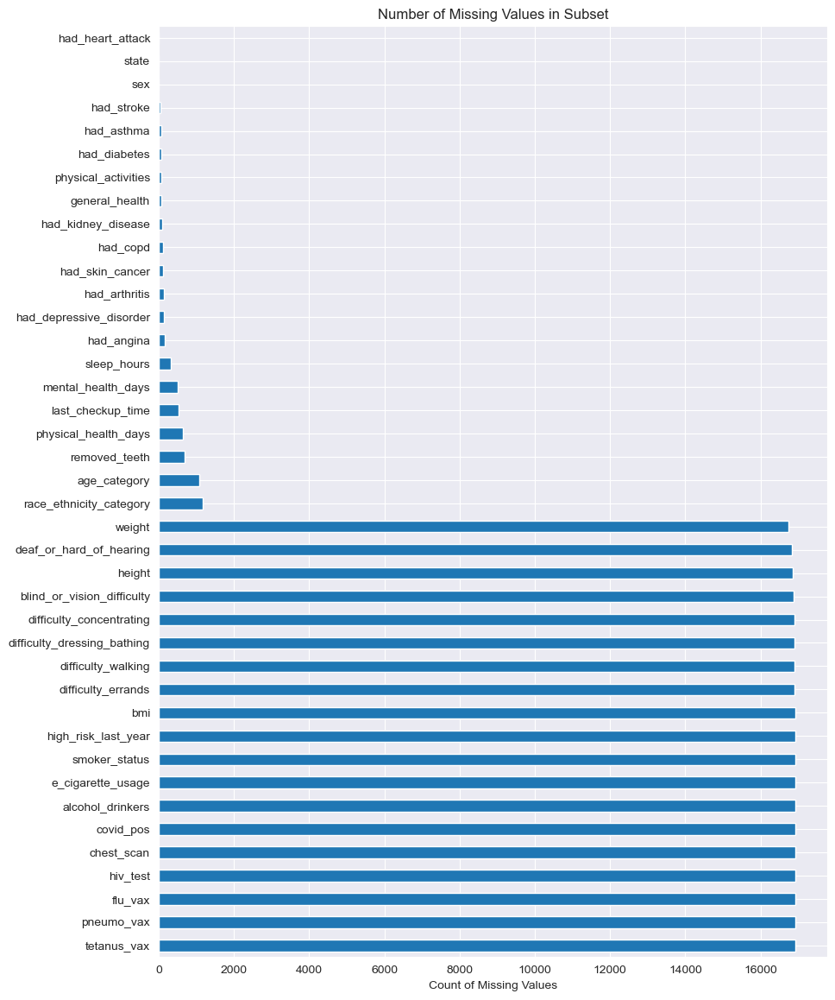

In [37]:
# plot the number of missing values per feature/survey question 
plt.figure(figsize=(10, 14))

# count the number of missing values each feature, sort with descending order
row_19_na_df.isna().sum().sort_values(ascending=False).plot(kind='barh')
plt.title('Number of Missing Values in Subset')
plt.xlabel('Count of Missing Values')

plt.show()

**Takeaways**:
- There are 19 commonly missed questions, which is consistent with the number of missing questions per row.
- Survey questions such as `tetanus_vax`, `pneumo_vax`, `flu_vax` may be skipped by respondents as they do not know or cannot recall such information. All three vaccination questions exhibit a high frequency of missing values, which is understandable, as many individuals may not be aware of the vaccinations they have received.
- Survey questions such as `high_risk_last_year`, `difficulty_walking`, `difficulty_concentrating` may be skipped due to vague descriptions.
- Survey questions such as `alcohol_drinkers`, `smoker_status`, `e_cigarette_usage`, `covid_pos` may be skipped due to lack of exhaustive options. 


#### Analysis of respondents who has 8 to 10 missing values per observations

In [38]:
# filter rows with 8-10 missing values
row_810_na_df = heart_attack_clean[heart_attack_clean.isna().sum(axis=1).isin([8, 9, 10])]

In [39]:
# get the total number of observations in the subset
print('Total number of observations in subset with 8 to 18 missing values per row: ', row_810_na_df.shape[0])


Total number of observations in subset with 8 to 18 missing values per row:  12555


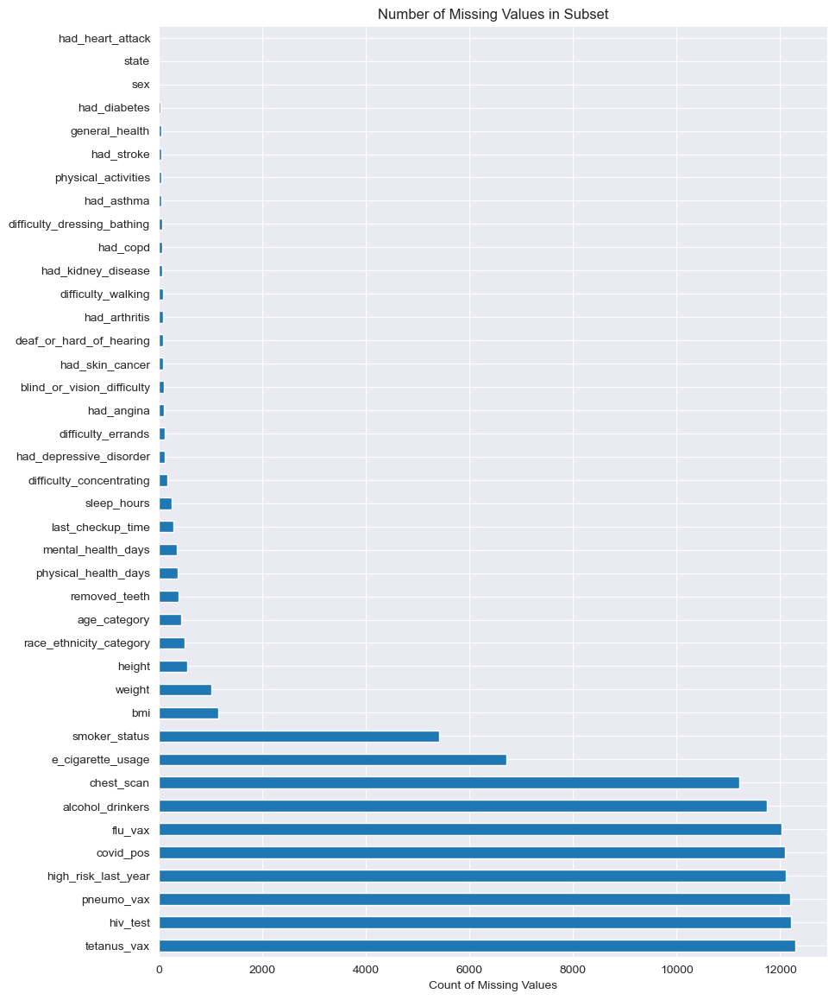

In [40]:
# plot the number of missing values per feature/survey question 
plt.figure(figsize=(10, 14))

# count the number of missing values each feature, sort with descending order
row_810_na_df.isna().sum().sort_values(ascending=False).plot(kind='barh')
plt.title('Number of Missing Values in Subset')
plt.xlabel('Count of Missing Values')

plt.show()

**Takeaways**:
- There are 10 commonly missed questions (from`smoker_status` to `tetanus_vax`), which is consistent with the number of missing values per observation.
- All of the variable collapsed with those found in the previous study case with 19-20 observations.
- **The systematic pattern of missing values can introduce bias into analyses and distort model performance in real-world applications if values for these observations are imputed. Therefore, I will drop rows that contain 10 or more missing values, which corresponds to 25% or more missing data per row.**

#### Actions - Drop rows with 10 or more missing values
- Before dropping any rows, I will first assess the percentage of total observations that will be removed. If this percentage does not significantly compromise the integrity of the dataset, I will proceed with the removal.

- Additional exploratory data analysis (EDA) on missing values will be conducted in later sections to further understand the patterns and identify optimal solutions.

In [41]:
# get the number of rows to be dropped 
drop_rows_count = heart_attack_clean.isna().sum(axis=1).loc[lambda x: x >= 10].count()
print('Number of rows to be dropped in this stage is:', drop_rows_count)
print(f'Dropping {(drop_rows_count / heart_attack_raw.shape[0]):.1%} observations')

Number of rows to be dropped in this stage is: 33683
Dropping 7.6% observations


- Dropping 7.6% is a relatively small portion of the dataset, and the majority of data remains inace and capable of probiving reliable results

In [42]:
# update drop counter
drop_counter += drop_rows_count

In [43]:
# get the count of missing values per row 
heart_attack_clean.isna().sum(axis=1).value_counts().sort_index()

0     247367
1      85947
2      36304
3      15481
4       6774
5       3732
6       3451
7       2858
8       4305
9       2165
10      6085
11      2126
12      1686
13      1616
14      1305
15      1258
16      1404
17       422
18       855
19     13070
20      2749
21       782
22       200
23        77
24        21
25         9
26         6
27         5
28         1
29         4
30         1
31         1
Name: count, dtype: int64

In [44]:
# Drop rows with 10 or more missing values, which equats to keep rows nans less than 10
heart_attack_clean = heart_attack_clean.loc[heart_attack_clean.isna().sum(axis=1) < 10, :]

In [45]:
# sanity check 
heart_attack_clean.isna().sum(axis=1).value_counts().sort_index()

0    247367
1     85947
2     36304
3     15481
4      6774
5      3732
6      3451
7      2858
8      4305
9      2165
Name: count, dtype: int64

In [46]:
# sanity check 
print('Updated dataset shape is:', heart_attack_clean.shape)

Updated dataset shape is: (408384, 40)


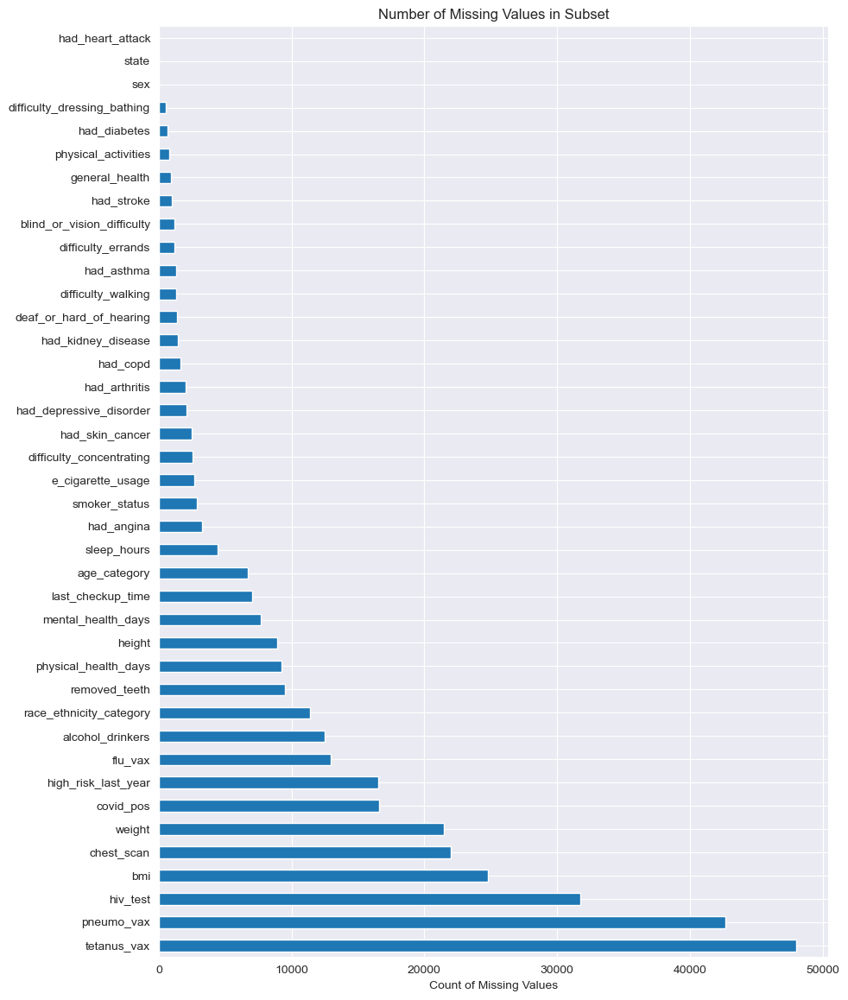

In [47]:
# plot the number of missing values per feature/survey question 
plt.figure(figsize=(10, 14))

# count the number of missing values each feature, sort with descending order
heart_attack_clean.isna().sum().sort_values(ascending=False).plot(kind='barh')
plt.title('Number of Missing Values in Subset')
plt.xlabel('Count of Missing Values')

plt.show()

**Takeaways**
- There are still significant missing values in features such as `tetanus_vax`, `pneumo_vax`, and `tetanus_vax`which supports my assumption that respondents may have intentionally skipped these questions due to unknown results or vague survey descriptions. **Such apattern suggests that adding an 'Unknown' category and assign nans into such columns might be an appropriate solution.** 
- The systematic pattern of multiple questions exhibiting similar levels of missing values has been addressed. As a result, the updated dataset is now more reliable. 
- Multiple rounds of EDA will be conducted in the following sections to identify optimal solutions for addressing the missing values.
---

#### 3.3.4 Missing Values in Rows  <a class="anchor" id="3c4"></a>

Check the percentage of missing values within each feature

In [48]:
# Get the percentage of missing values in columns
heart_attack_clean.isna().mean().sort_values(ascending=False) * 100

tetanus_vax                    11.753154
pneumo_vax                     10.445561
hiv_test                        7.776504
bmi                             6.074920
chest_scan                      5.379741
weight                          5.250451
covid_pos                       4.068965
high_risk_last_year             4.042029
flu_vax                         3.175688
alcohol_drinkers                3.058886
race_ethnicity_category         2.785858
removed_teeth                   2.332609
physical_health_days            2.264046
height                          2.178342
mental_health_days              1.879848
last_checkup_time               1.722399
age_category                    1.635715
sleep_hours                     1.089661
had_angina                      0.802431
smoker_status                   0.708892
e_cigarette_usage               0.653062
difficulty_concentrating        0.625637
had_skin_cancer                 0.611679
had_depressive_disorder         0.512508
had_arthritis   

- Since dropping missing values for features with less than 2% missing data has a minimal impact on the overall dataset, it helps maintain the integrity of the analysis without significantly compromising the sample size or introducing bias. Additionally, a cleaner dataset can facilitate more effective imputation of missing values conducted in later stages.

In [49]:
# filter the columns that has under 2% missing values, greater than zero at the same time
drop_col = [col for col in heart_attack_clean.columns 
              if (heart_attack_clean[col].isna().mean() >0) & (heart_attack_clean[col].isna().mean() < 0.02)]

In [50]:
# calculate the number of rows to be dropped
drop_count = heart_attack_clean[drop_col].isna().any(axis=1).sum()
print('Number of rows to be dropped in this stage is:', drop_count)
print(f'Dropping {(drop_count / heart_attack_raw.shape[0]):.1%} observations')

Number of rows to be dropped in this stage is: 46423
Dropping 10.4% observations


In [51]:
# update counter
drop_counter += drop_count

In [52]:
# drop missing values
heart_attack_clean.dropna(subset=drop_col, inplace=True)

In [53]:
# sanity check
heart_attack_clean.isna().mean().sort_values(ascending=False) * 100

tetanus_vax                    10.908910
pneumo_vax                      9.843602
hiv_test                        7.166242
bmi                             5.154146
chest_scan                      4.650501
weight                          4.459873
covid_pos                       3.740182
high_risk_last_year             3.689348
flu_vax                         2.795881
alcohol_drinkers                2.534803
race_ethnicity_category         2.288368
removed_teeth                   1.919820
height                          1.650730
physical_health_days            1.446565
difficulty_concentrating        0.000000
blind_or_vision_difficulty      0.000000
difficulty_walking              0.000000
sex                             0.000000
difficulty_dressing_bathing     0.000000
difficulty_errands              0.000000
last_checkup_time               0.000000
had_arthritis                   0.000000
deaf_or_hard_of_hearing         0.000000
had_diabetes                    0.000000
had_depressive_d

There are still columns that have missing values under 2% due to the fact some observations have multiple missing features, and missing values in columns such as `physical_health_days` are dropped at the same time.

In [54]:
# sanity check dataframe shape
print('Updated dataset shape is:', heart_attack_clean.shape)

Updated dataset shape is: (361961, 40)


---
## 4. Preliminary EDA <a class="anchor" id="4"></a>

- In this preliminary EDA section, I will focus on examining the distribution of each variable and how these distributions differ for respondents who had a heart attack versus those who did not have a heart attack. 
- I will breakdown this section into two parts: numeric variables and categorical variables.
---

### 4.1 Numeric Variables <a class="anchor" id="4a"></a>

In [55]:
# recap of numeric columns
num_cols

Index(['height', 'weight', 'bmi', 'sleep_hours', 'physical_health_days',
       'mental_health_days'],
      dtype='object')

In [56]:
# Subsetting the dataset into subsets with values of Yes and No had_heart_attack
heart_attack_yes = heart_attack_clean[heart_attack_clean['had_heart_attack'] == 'Yes']
heart_attack_no = heart_attack_clean[heart_attack_clean['had_heart_attack'] == 'No']

- Plot a histogram for each numeric varible to examine its distribution.
- Use overlapping histograms to visualize distrubutions of each feature for individuals who had a heart attack vs who did not.

#### `height`


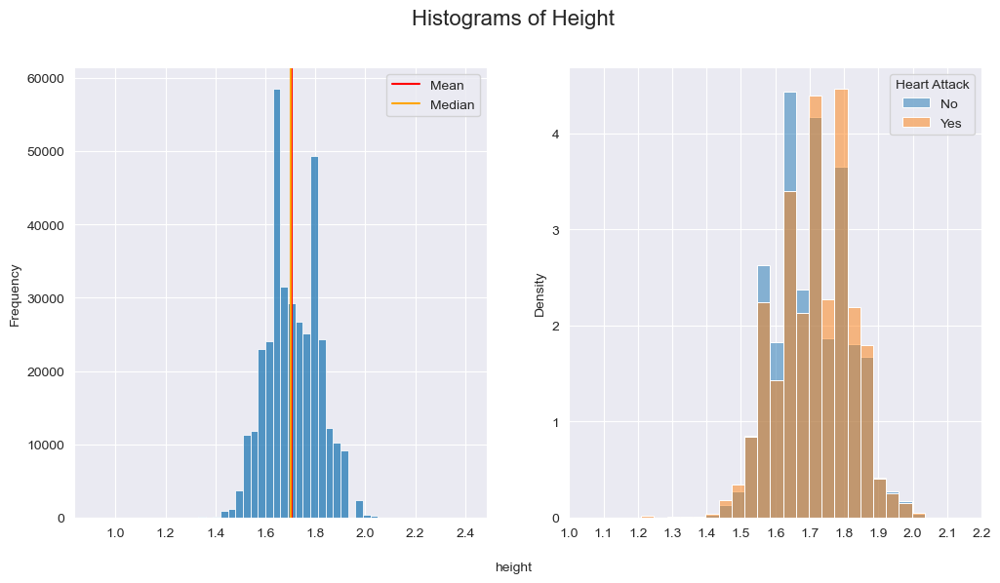

In [57]:
# discover the distribution of height
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# first histogram: plot using whole dataset
sns.histplot(heart_attack_clean['height'], bins=50, ax=ax[0])
ax[0].axvline(x=heart_attack_clean['height'].mean(), color='red', label='Mean')
ax[0].axvline(x=heart_attack_clean['height'].median(), color='orange', label='Median')
ax
ax[0].set_xlabel('')
ax[0].set_ylabel('Frequency')
ax[0].legend()

# second plot: overlapping histograms disginguished by had_heart_attack
sns.histplot(heart_attack_no['height'], bins=40, stat='density', alpha=0.5, label='No', ax=ax[1])
sns.histplot(heart_attack_yes['height'], bins=40, stat='density', alpha=0.5, label='Yes', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Density')
ax[1].set_xlim(1, 2.2)
ax[1].set_xticks(np.arange(1, 2.3, 0.1))
ax[1].legend(title='Heart Attack')

# set properties that share titles and xlabes
fig.suptitle('Histograms of Height', fontsize=16)
fig.text(0.5, 0.02, 'height', ha='center')

plt.show()

**Takeaways `height`**:
- Left: **two bars exhibit high frequencies**, likely influenced by the `sex` variable. Further investigation is required to identify the most appropriate method for imputing the missing values.
- Right: Respondents who **did not** experience a heart attack are more concentrated between **heights 1.55 - 1.7 meters**, while those who **did have a heart attack** cluster between **1.7 - 1.85 meters**. This suggests that height may have an effect on the likelihood of experiencing a heart attack, or it could just be a confounding variable.
---

#### `weight`

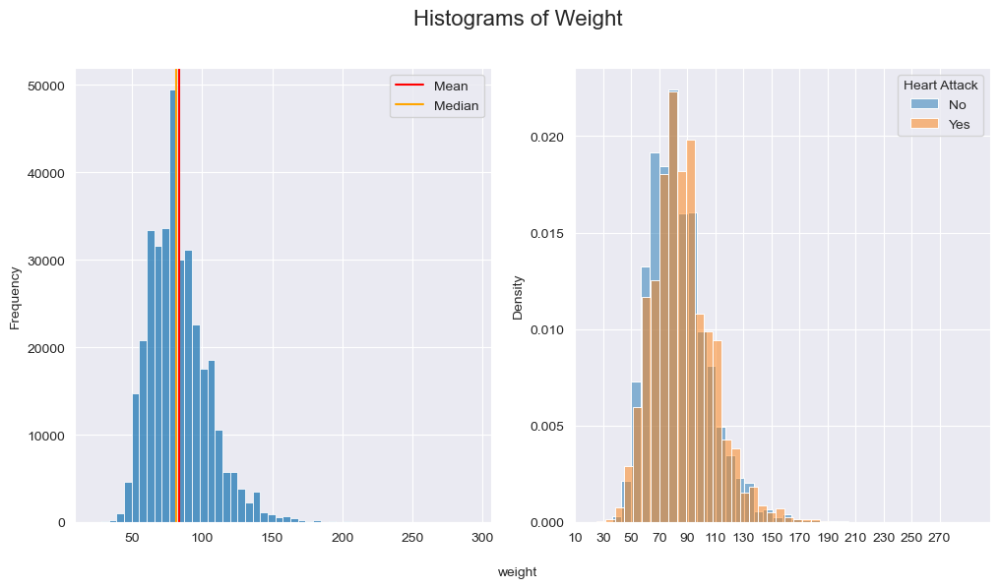

In [58]:
# discover the distribution of weight
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# first histogram: plot using whole dataset
sns.histplot(heart_attack_clean['weight'], bins=50, ax=ax[0])
ax[0].axvline(x=heart_attack_clean['weight'].mean(), color='red', label='Mean')
ax[0].axvline(x=heart_attack_clean['weight'].median(), color='orange', label='Median')
ax[0].set_xlabel('')
ax[0].set_ylabel('Frequency')
ax[0].legend()

# second plot: overlapping histograms disginguished by had_heart_attack
sns.histplot(heart_attack_no['weight'], bins=40, stat='density', alpha=0.5, label='No', ax=ax[1])
sns.histplot(heart_attack_yes['weight'], bins=40, stat='density', alpha=0.5, label='Yes', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Density')
ax[1].set_xticks(np.arange(10, 280, 20))
ax[1].legend(title='Heart Attack')

# set properties that share titles and xlabes
fig.suptitle('Histograms of Weight', fontsize=16)
fig.text(0.5, 0.02, 'weight', ha='center')

plt.show()

**Takeaways `weight`**:
- Left: The distribution is approximately normal with outliers on right tail.
- Right: Respondents who **did not** experience a heart attack are more concentrated at weights **between 50 and 80 kilograms**, while those who **did have a heart attack** cluster **between 90 to 130 kilos**. This suggests that weight may have an effect on the likelihood of experiencing a heart attack.
---

#### `bmi`

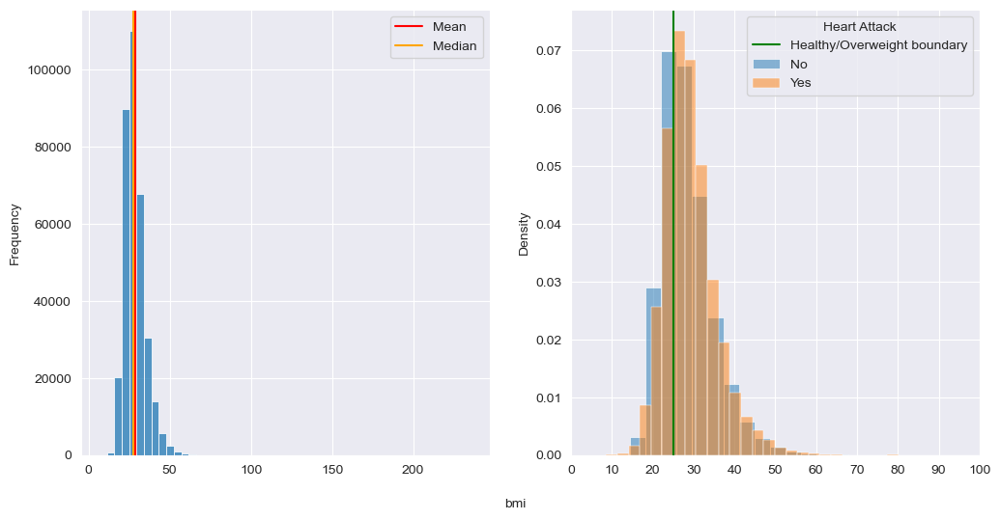

In [59]:
# discover the distribution of bmi
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# first histogram: plot using whole dataset
sns.histplot(heart_attack_clean['bmi'], bins=50, ax=ax[0])
ax[0].axvline(x=heart_attack_clean['bmi'].mean(), color='red', label='Mean')
ax[0].axvline(x=heart_attack_clean['bmi'].median(), color='orange', label='Median')
ax[0]
ax[0].set_xlabel('')
ax[0].set_ylabel('Frequency')
ax[0].legend()

# second plot: overlapping histograms disginguished by had_heart_attack
sns.histplot(heart_attack_no['bmi'], bins=60, stat='density', alpha=0.5, label='No', ax=ax[1])
sns.histplot(heart_attack_yes['bmi'], bins=60, stat='density', alpha=0.5, label='Yes', ax=ax[1])
ax[1].axvline(x=25, color='green', label='Healthy/Overweight boundary')
ax[1].set_xlabel('')
ax[1].set_ylabel('Density')
ax[1].set_xlim(0, 100)
ax[1].set_xticks(np.arange(0, 110, 10))
ax[1].legend(title='Heart Attack')


# set properties that share titles and xlabes
fig.text(0.5, 0.02, 'bmi', ha='center')

plt.show()


**Takeaways `bmi`**:
- Interpretation of BMI ranges:
    - under 18.4: underweight
    - between 18.5 and 24.9: healthy. 
    - between 25 and 29.9: overweight. 
    - between 30 and 39.9 obese. 
    - 40 or over – extreme obese.
- Left: The distribution is approximately normal.
- Right: **`bmi` has an obvious correlation with target variable. The Green line is the boundary line cutting people into'Healthy' and 'Overweight' group, and we can clearly tell that people who are 'Underweight' and 'Healthy' are less likely to have a heart attack while those who are 'Overweright', 'Obese', or 'Extreme Obese'.**

**Feature Engineering Opportunity:** 
After data cleaning, I can create a new feature and categorize respondents into different body health groups instead of using bmi in numbers.

___

#### `sleep_hours`

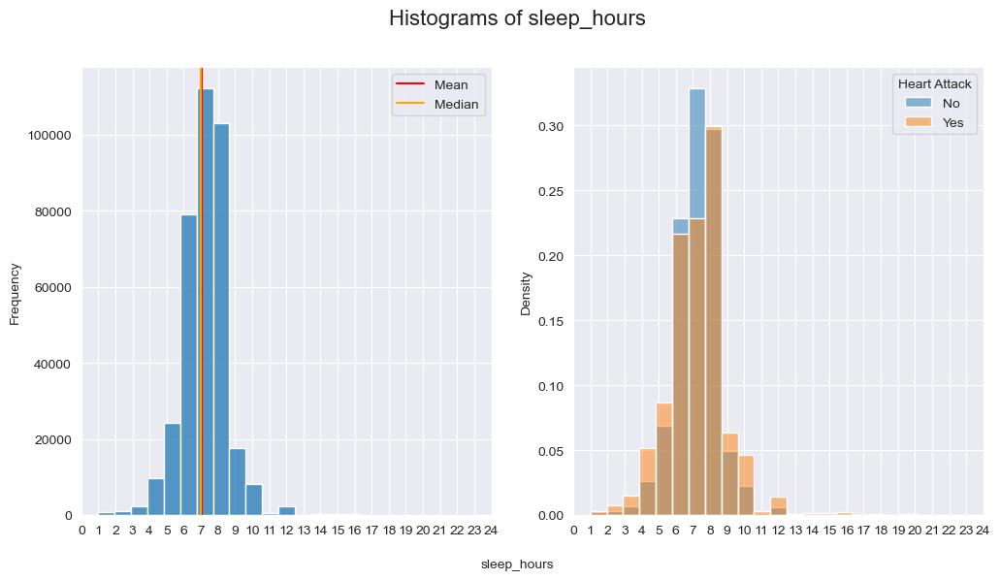

In [60]:
# discover the distribution of sleep_hours
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# first histogram: plot using whole dataset
sns.histplot(heart_attack_clean['sleep_hours'], bins=24, ax=ax[0])
ax[0].axvline(x=heart_attack_clean['sleep_hours'].mean(), color='red', label='Mean')
ax[0].axvline(x=heart_attack_clean['sleep_hours'].median(), color='orange', label='Median')
ax[0].set_xlabel('')
ax[0].set_ylabel('Frequency')
ax[0].set_xlim(0, 24)
ax[0].set_xticks(np.arange(0, 25, 1))
ax[0].legend()

# second plot: overlapping histograms disginguished by had_heart_attack
sns.histplot(heart_attack_no['sleep_hours'], bins=24, stat='density', alpha=0.5, label='No', ax=ax[1])
sns.histplot(heart_attack_yes['sleep_hours'], bins=24, stat='density', alpha=0.5, label='Yes', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Density')
ax[1].set_xlim(0, 24)
ax[1].set_xticks(np.arange(0, 25, 1))
ax[1].legend(title='Heart Attack')

# set properties that share titles and xlabes
fig.suptitle('Histograms of sleep_hours', fontsize=16)
fig.text(0.5, 0.02, 'sleep_hours', ha='center')

plt.show()

**Takeaways `sleep hours`**:
- Left: The distribution is approximately normal with left-skewed tail.
- Right: **Respondents who did not experience a heart attack are more concentrated at sleep hours between 6 - 7 hours. Interestingly, those who did have a heart attack cluster are spreded at two tails - sleep hours below 6 and sleep hours above 9 hours.**
---

#### `physical_health_days`

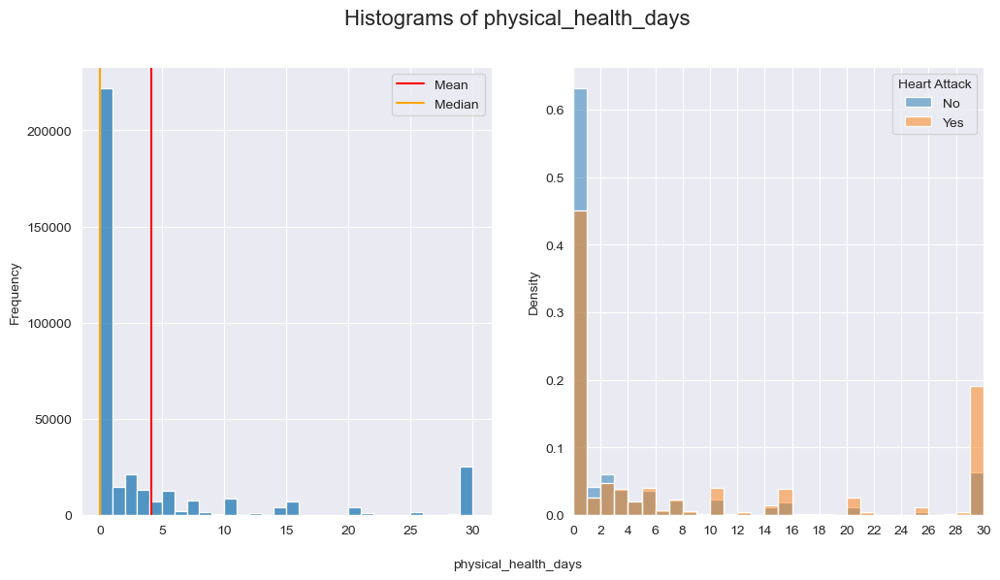

In [61]:
# discover the distribution of physical_health_days
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# first histogram: plot using whole dataset
sns.histplot(heart_attack_clean['physical_health_days'], bins=30, ax=ax[0])
ax[0].axvline(x=heart_attack_clean['physical_health_days'].mean(), color='red', label='Mean')
ax[0].axvline(x=heart_attack_clean['physical_health_days'].median(), color='orange', label='Median')
ax[0].set_xlabel('')
ax[0].set_ylabel('Frequency')
ax[0].legend()

# second plot: overlapping histograms disginguished by had_heart_attack
sns.histplot(heart_attack_no['physical_health_days'], bins=30, stat='density', alpha=0.5, label='No', ax=ax[1])
sns.histplot(heart_attack_yes['physical_health_days'], bins=30, stat='density', alpha=0.5, label='Yes', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Density')
ax[1].set_xlim(0, 30)
ax[1].set_xticks(np.arange(0, 31, 2))
ax[1].legend(title='Heart Attack')

# set properties that share titles and xlabes
fig.suptitle('Histograms of physical_health_days', fontsize=16)
fig.text(0.5, 0.02, 'physical_health_days', ha='center')

plt.show()

**Takeaways `physical_health_days`**:
- Left: A significant number of respondents report 0 days of either physical or mental health issues, with a smaller proportion of observations extending far to the right of 30 days.
- Right: respondents with **0 poor physical health days have a lower heart attack frequency**, while those with all **30 days report a higher proportion** of heart attacks.
---

#### `mental_health_days`

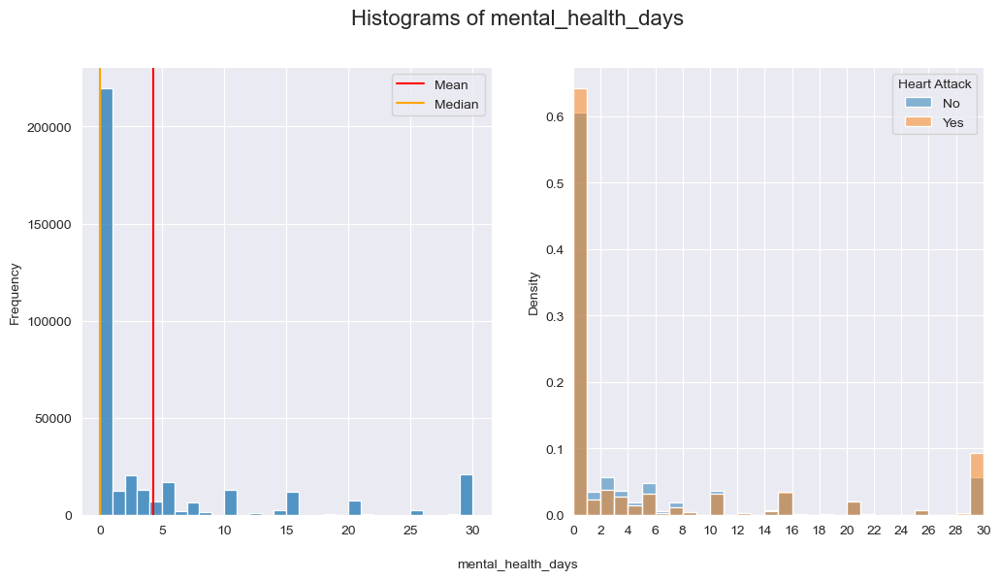

In [62]:
# discover the distribution of mental_health_days
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# first histogram: plot using whole dataset
sns.histplot(heart_attack_clean['mental_health_days'], bins=30, ax=ax[0])
ax[0].axvline(x=heart_attack_clean['mental_health_days'].mean(), color='red', label='Mean')
ax[0].axvline(x=heart_attack_clean['mental_health_days'].median(), color='orange', label='Median')
ax[0].set_xlabel('')
ax[0].set_ylabel('Frequency')
ax[0].legend()

# second plot: overlapping histograms disginguished by had_heart_attack
sns.histplot(heart_attack_no['mental_health_days'], bins=30, stat='density', alpha=0.5, label='No', ax=ax[1])
sns.histplot(heart_attack_yes['mental_health_days'], bins=30, stat='density', alpha=0.5, label='Yes', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Density')
ax[1].set_xlim(0, 30)
ax[1].set_xticks(np.arange(0, 31, 2))
ax[1].legend(title='Heart Attack')

# set properties that share titles and xlabes
fig.suptitle('Histograms of mental_health_days', fontsize=16)
fig.text(0.5, 0.02, 'mental_health_days', ha='center')

plt.show()

**Takeaways `mental_health_days`**:
- Left: The distribution exhibit a very similar pattern compared to `physical_health_days`. The correlation between these two variables can be further investigated, and might help imputing missing values. 
- Right: Unlike the partterns discovered from `physical_health_days`, respondents with **both 0 and 30 poor mental health days** all had a **higher frequency in getting a heart attack**.
---

### 4.2 Categorical Variables <a class="anchor" id="4b"></a>

In [63]:
# recap of categorical columns
print(cat_cols)

# sanity check, should have 34 categorical columns
print(f'Number of categorical columns: {len(cat_cols)}')

Index(['sex', 'race_ethnicity_category', 'age_category', 'state',
       'alcohol_drinkers', 'general_health', 'smoker_status',
       'e_cigarette_usage', 'physical_activities', 'had_angina', 'had_stroke',
       'had_asthma', 'had_skin_cancer', 'had_copd', 'had_diabetes',
       'had_kidney_disease', 'had_depressive_disorder', 'had_arthritis',
       'deaf_or_hard_of_hearing', 'blind_or_vision_difficulty',
       'difficulty_walking', 'difficulty_concentrating',
       'difficulty_dressing_bathing', 'difficulty_errands', 'removed_teeth',
       'last_checkup_time', 'chest_scan', 'hiv_test', 'covid_pos', 'flu_vax',
       'tetanus_vax', 'pneumo_vax', 'high_risk_last_year', 'had_heart_attack'],
      dtype='object')
Number of categorical columns: 34


- I will use a for loop to iterate over each categorical variable. For each categorical column:
    - Create a count plot to examine the distribution across categories.
    - Generate a bar plot illustrating the likelihood of having a heart attack across different categories within each feature. The likelihood is calculated by the percentage of respondents who reported having a heart attack within each category. For instance, if 3% of females reported having a heart attack, it translates to a 3% probability of females having a heart attack.

- `state` has over 50 unique values, so plotting all categories on a single plot will make the bars too clustered and difficult to visulize. Instead, I will create plots for `state` separately.

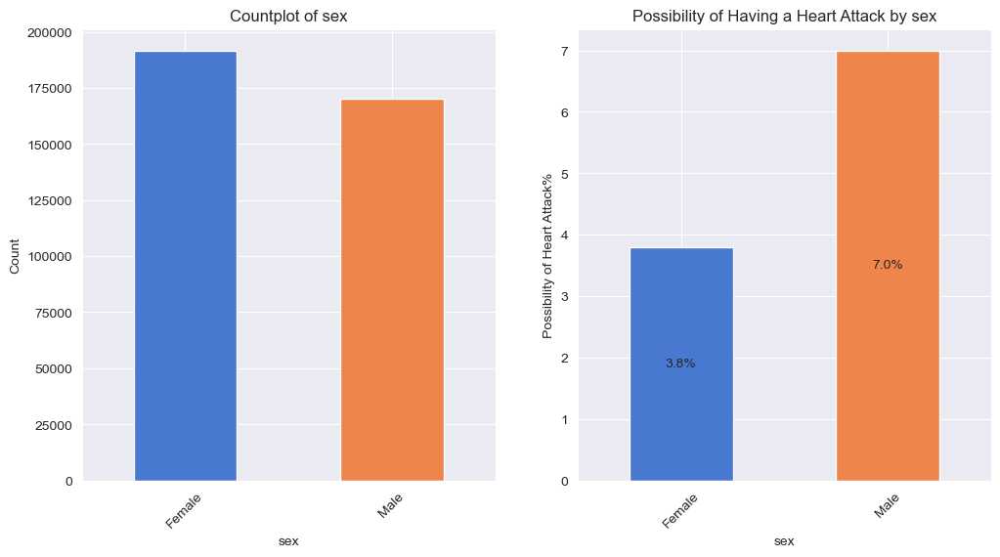

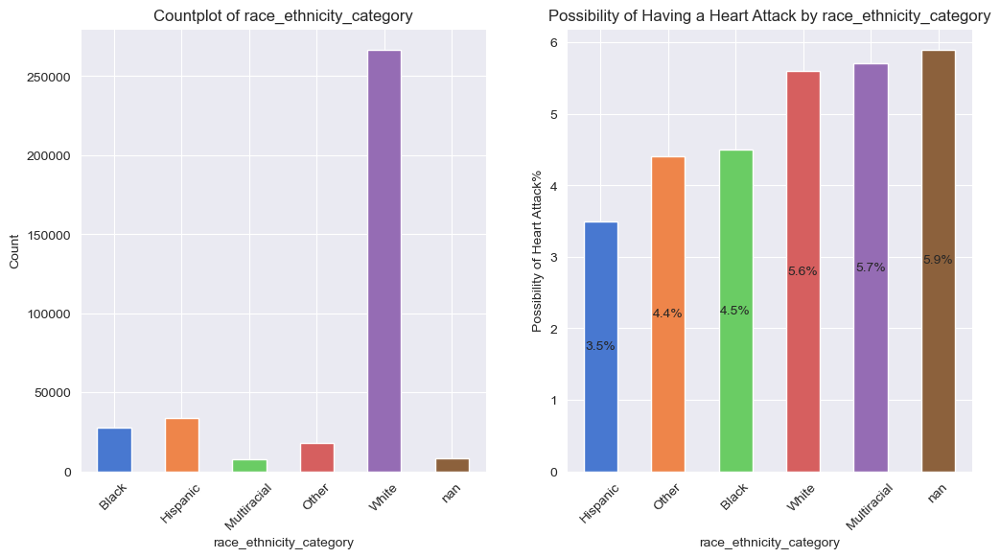

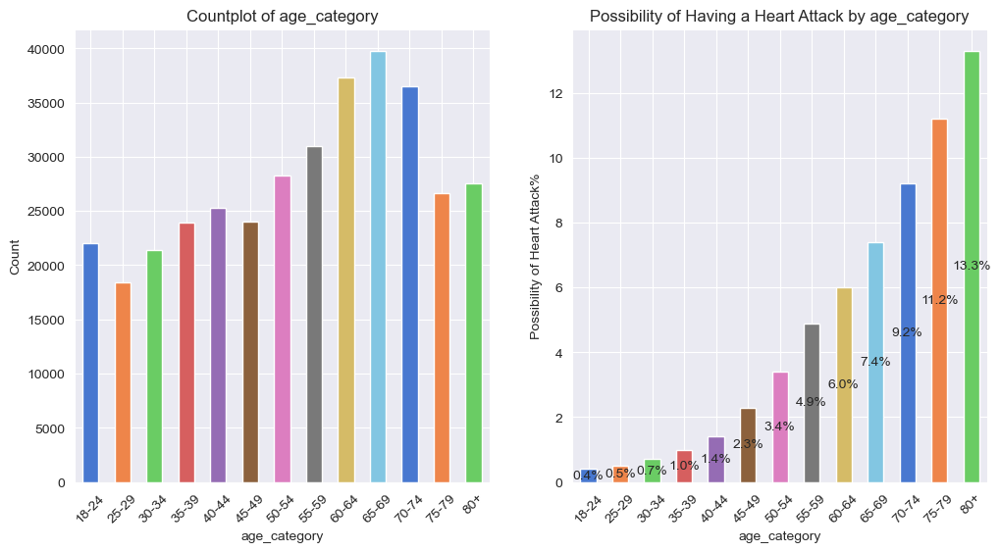

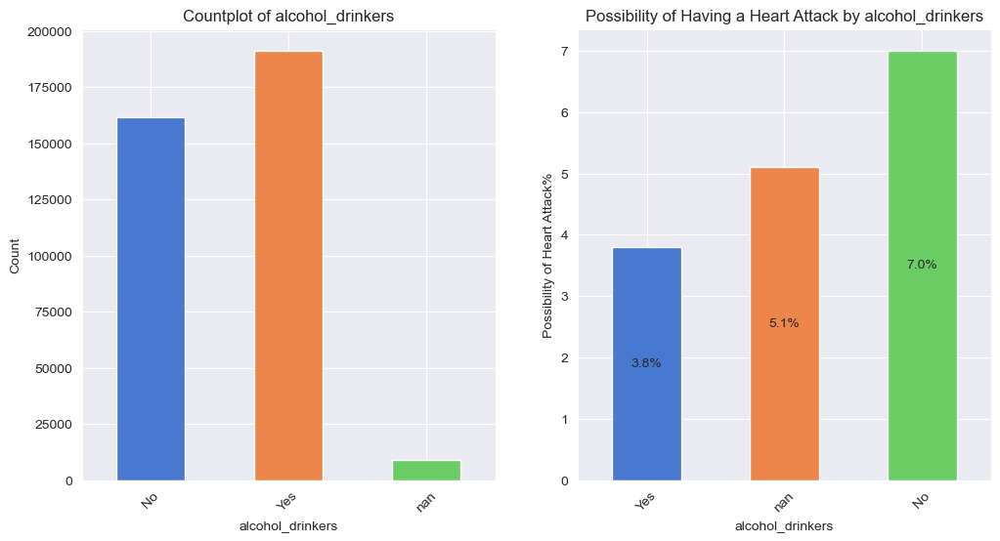

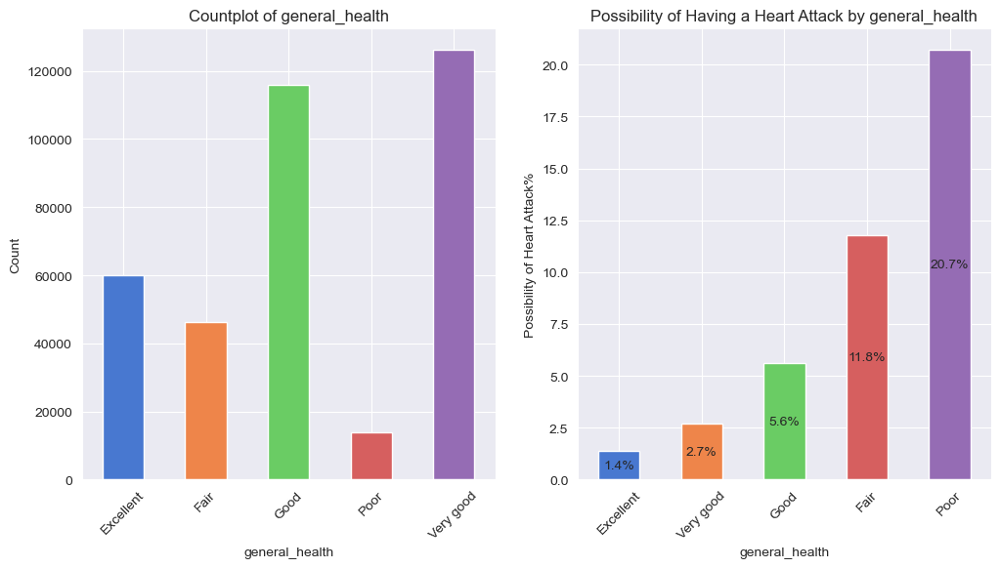

...

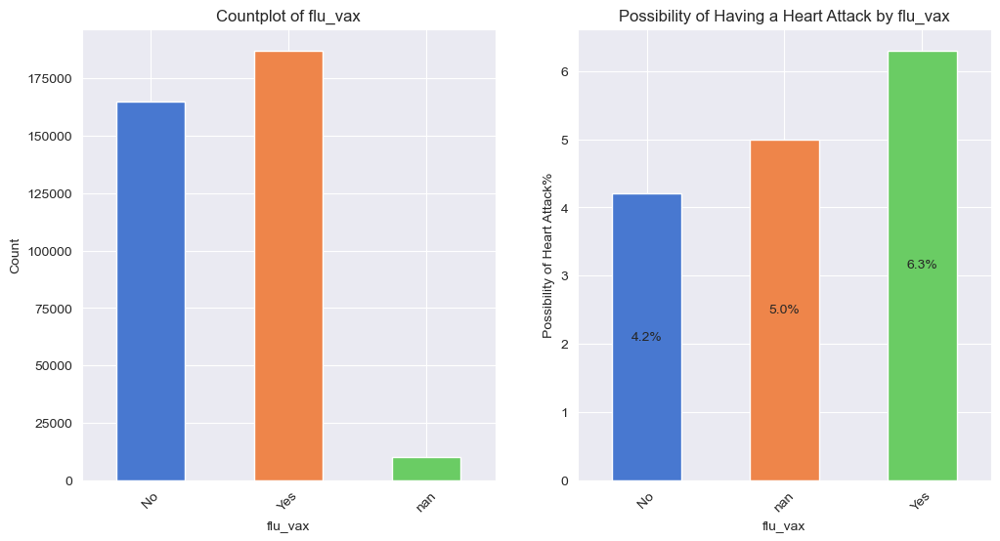

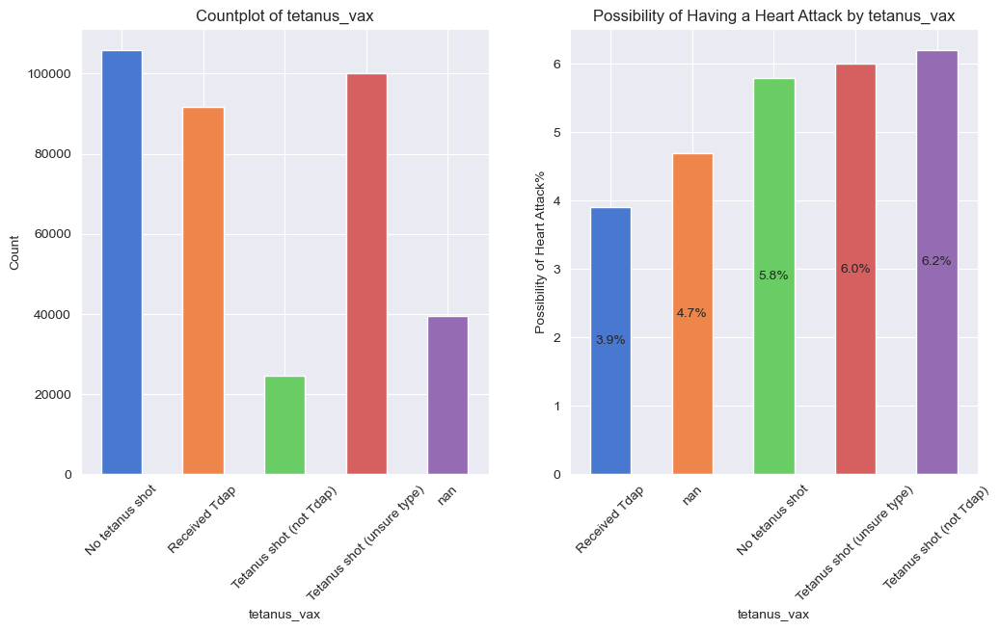

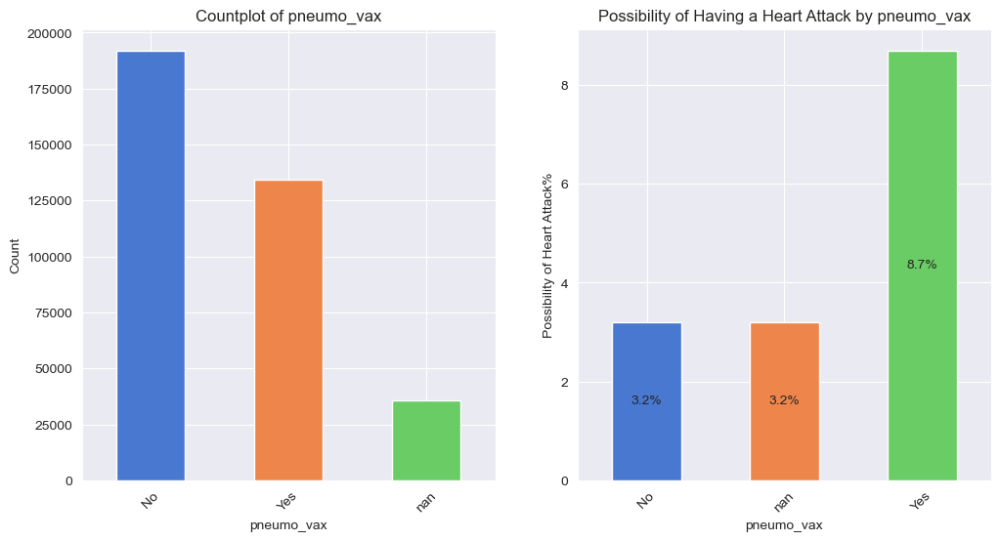

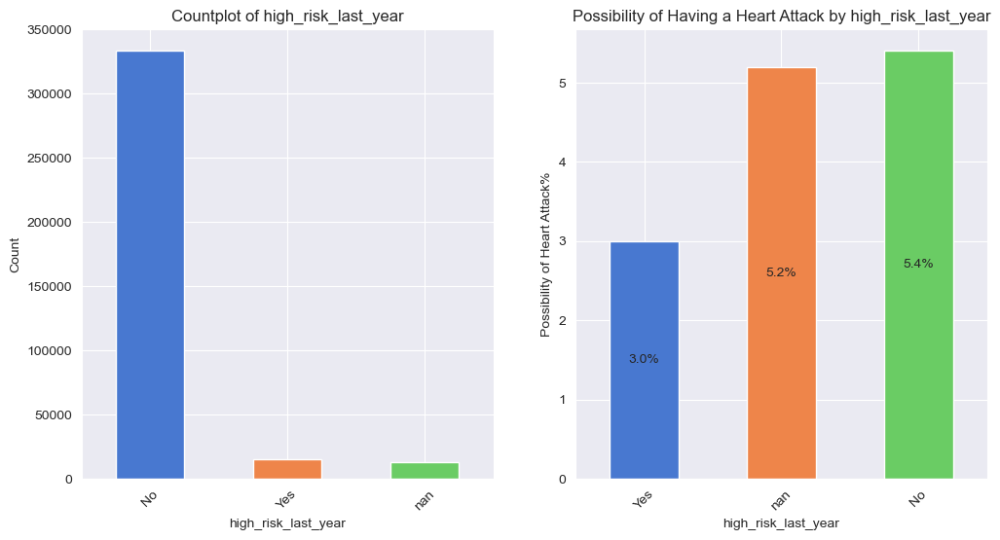

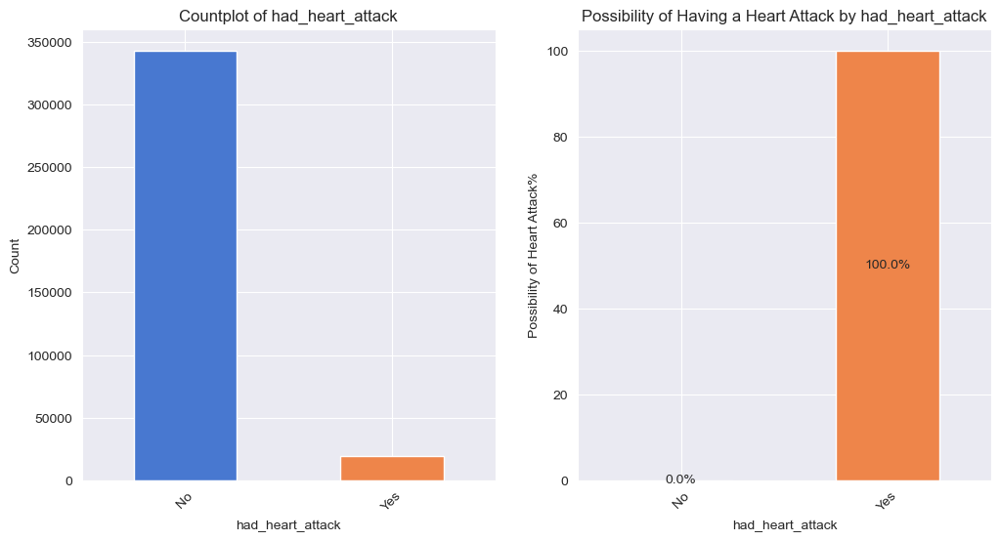

In [64]:
# use for loops to iterate each catgorical columns 
for col in cat_cols:
    
    # filter out state column
    if col == 'state':
        continue
    
    # create a cross_table with the count of each col regards to had_heart_attack
    cross_table = pd.crosstab(heart_attack_clean[col], heart_attack_clean['had_heart_attack'], dropna=False)
    
    # use cross_table.sum(axis)=1 to find the sum of each category,
    # use div, with axis=0 on the above results to find the percentage of each category had/not had a heart attack
    # use round to 1 decimal point, and sort_values for aesthetic purpose
    percentage_table = (cross_table.div(cross_table.sum(axis=1), axis=0) * 100).round(1).sort_values(by='Yes')
    

    # create a 1 row, 2 col subplot, set figsize
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    palette = sns.color_palette("muted")

    # create first subplot, countplot of each category of col
    cross_table.sum(axis=1).plot(kind='bar',ax=ax[0], color=palette)
    ax[0].set_title(f'Countplot of {col}')
    ax[0].set_ylabel('Count')
    ax[0].tick_params(axis='x', rotation=45)

    # create second subplot, stacked-barplot showing the percentage of each category had/not had a heart attack
    ax_1 = percentage_table['Yes'].plot(kind='bar', stacked=True, ax=ax[1], color=palette)
    ax[1].set_title(f'Possibility of Having a Heart Attack by {col}')
    ax[1].set_ylabel('Possibility of Heart Attack%')
    ax[1].tick_params(axis='x', rotation=45)


    # show the percentages 
    for c in ax_1.containers:
        # get the heights of the bars
        heights = c.datavalues
        # create labels with % sign and round to 1 decimal place
        labels = [f'{value:.1f}%' for value in heights]
        # add labels 
        ax_1.bar_label(c, labels=labels, label_type='center')
        
    plt.show()

**Important Findings:**
1. **Target Variable `had_heart_attack`**: **The target variable has a very imbalanced distribution**. Such issue needs to be addressed before training the model.
2. `age_category`: **age** appears to be **highly correlated** with the likelihood of having a heart attack, which increases **exponentially** after age 45. **Individuals aged 80 and older are often excluded from most existing models, leaving a critical gap in early detection efforts for this vulnerable population.**
3. `sex`: **Male** have a significantly higher possibility of having a heart attack.
4. `general_health`: Individuals rating their health as **poor** has a **significantly higher likelihood** of having a heart attack compared to those who rate it as **excellent**.
5. `smoker_status`: **smoking frequency** appears to be **positvely correlated** with likelihood of heart attack.
6. `physical_activities`: Individuals who reported **no physical activity** in the past month have a **significantly higher** likelihood of having a heart attack. 
7. `had_angina`: Angina refers to chest pain caused by reduced blood flow to the heart. Respondents **with angina** have a **45.2%** likelihood of experiencing a heart attack, while those with **missing values** also show a **high risk at 34.3%.** My initial guessing is that some respondents who expereience angina cannot differentiate it with heart attack due to similar symptons, so decide to leave the answer blank.
8. `covid_pos`: Individuals who **had positive home test results** has the **least likelihood** of having a heart attack. **Several issues** were identified with this variable: 
    - The categories are **not mutually exclusive**; individuals can have both positive home test results and positive results from doctors, leading to inaccurate representations of actual conditions
    - The categories are **not exhaustive**, as negative home test results should also be included.
    - **Covid testing was primarily conducted between 2020 and 2023, making it unlikely for those using this model in the future to have recent Covid tests or relevant results from several years ago.** <br/><br/><br/>


**Other Findings:**
1. `race_ethnicity_category`: The distribution is highly imbalanced, with white respondents dominating. This may be due to differing levels of interest in healthcare survey participation, and access to healthcare services. Notably, 'Hispanic' individuals have a lower likelihood of experiencing a heart attack.
2. `alcohol_drinkers`: Interestingly, **alcohol drinkers** has a **lower likelihood** of heart attack.
3. `last_checkup_time`: Interestingly, individuals who had their **last checkup in the past year** show a **higher likelihood** of having a heart attack.
4. All medication history features exhibit a consistent pattern: respondents with certain disease histories, such as `had_stroke`, `had arthritis`, show a higher likelihood of having a heart attack.
5. Same pattern was discovered in physical difficulty features such as `difficulty_dressing_bathing`, `difficulty_walking`.
6. `removed_teeth`: An increasing number of removed teeth is associated with a higher likelihood of having a heart attack.People with 
7. The findings in points 4-6 may be linked to the fact that older individuals are more likely to exhibit these features. Given the positive correlation between age and the likelihood of having a heart attack, the features discussed in points 4-6 could act as confounding factors."
8.  Unlike`flu_vex` and `tetanus_vax`, `pneumo_vax` has uneven likelihood distribution where people who had such vaccination has a higher likelihood of having a heart attack. After some research online, I found that such vaccination are recommended for people over 65+ or people with chronic disease such as kidney disease. As a result, `pneumo_vax` could somehow be related to other features like `age_category` and `had_kidney_disease`.
---



#### `state`
1. Create a countplot of all states.
2. Create two stacked bar plots: one displaying the top 10 states with the highest likelihood of having a heart attack, and the other showing the bottom 10 states.


In [65]:
# get the cross_table for state, same process as above
cross_tb = pd.crosstab(heart_attack_clean['state'], heart_attack_clean['had_heart_attack'], dropna=False).sort_values(by='No',ascending=False)

# transform the cross_table into the percentage of each state having/not having a heart attack
pct_tb = ((cross_tb.div(cross_tb.sum(axis=1), axis=0) * 100)).round(1)

# sort percent table by the percentage of having a heart attack, using descending order
pct_tb = pct_tb.sort_values(by='Yes', ascending=False)


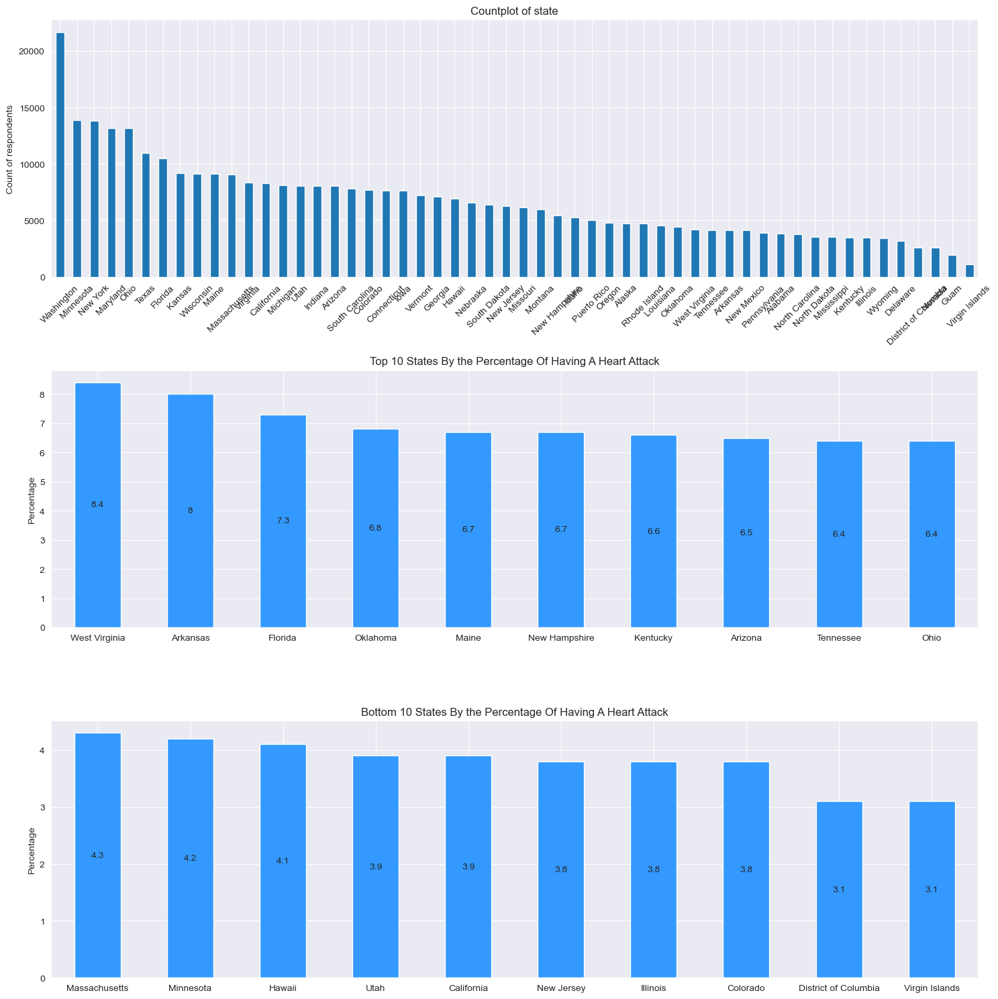

In [66]:
# create subplots with 3 rows, 1 column
fig, ax = plt.subplots(3, 1, figsize=(15,15))

# plot the count of respondents for each state
cross_tb.sum(axis=1).sort_values(ascending=False).plot(kind='bar', ax=ax[0])
ax[0].set_title('Countplot of state')
ax[0].set_xlabel('')
ax[0].set_ylabel('Count of respondents')
ax[0].tick_params(axis='x', rotation=45)

# plot the top 10 states in the percentage of respondents having a heart attack
ax_1 = pct_tb['Yes'][0:10].plot(kind='bar', stacked=True, ax=ax[1], color='#3399FF')
ax[1].set_title('Top 10 States By the Percentage Of Having A Heart Attack')
ax[1].set_xlabel('')
ax[1].set_ylabel('Percentage')
ax[1].tick_params(axis='x', rotation=0)
for c in ax_1.containers:
    ax_1.bar_label(c, label_type='center')

# plot the bottom 10 states in the percentage of respondents having a heart attack
ax_2 = pct_tb['Yes'][-10:].plot(kind='bar', stacked=True, ax=ax[2], color='#3399FF')    
ax[2].set_title('Bottom 10 States By the Percentage Of Having A Heart Attack')
ax[2].set_xlabel('')
ax[2].set_ylabel('Percentage')
ax[2].tick_params(axis='x', rotation=0)
for c in ax_2.containers:
    ax_2.bar_label(c, label_type='center')

plt.tight_layout()
plt.show()

**Takeaways from `states`**:
- Washington and New York have the highest total number of respondents, while Guam and the Virgin Islands show the least number of observations. The [original data source](https://www.cdc.gov/brfss/annual_data/annual_2022.html) does not provide specific explanations for this phenomenon. However, upon cross-comparing the datasets from 2020 to 2023, I observed similar patterns in these years as well. Therefore, I believe this pattern may result from the way the survey is conducted across the U.S. and the populations of each state.
- Comparing the two bottom charts, the percentage of heart attack occurrences **differs significantly between states** like **West Virginia** and **Arkansas**, which have high percentages, and those with lower percentages, such as **Colorado**, the **Virgin Islands**, and the **District of Columbia**.
- The [Geographical plot](https://public.tableau.com/app/profile/will.wu1217/viz/HeartAttackPredictionModelGeographicalPlot/Sheet1?publish=yes) reveals that **states located near the coast** tend to have a **lower likelihood** of heart attack.
---


### 4.3 Value Created <a class="anchor" id="4c"></a>

- In my research of existing models at the proposal stage for this project, I found that most cardiovascular disease calculators impose age limits between 30 and 79. To illustrate the potential benefits of my model, I would like to present an additional visual in this section.
- The graph below clearly shows that respondents aged 80 and above have the highest likelihood of experiencing a heart attack. Unfortunately, they are excluded from current calculators, limiting their ability to accurately assess their risk. In contrast, my model does not have an age ceiling, allowing older adults to utilize it for early detection of heart attack risks and take proactive measures as needed.

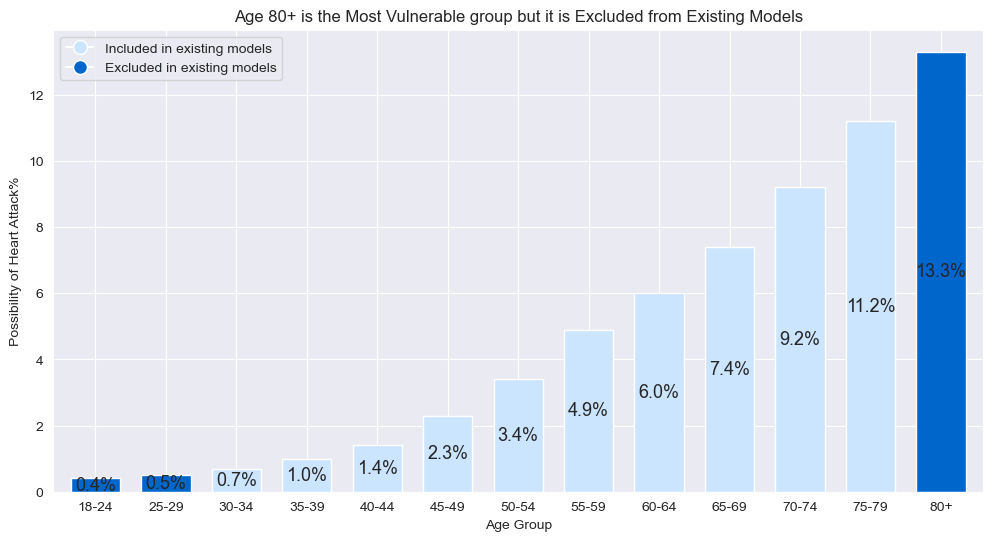

In [67]:
# create a 
cross_table_age_ha =pd.crosstab(heart_attack_clean['age_category'], heart_attack_clean['had_heart_attack'])
pct_tb_age_ha = (cross_table_age_ha.div(cross_table_age_ha.sum(axis=1), axis=0) * 100).round(1)


plt.figure(figsize=(12,6))

age_colors = ['#0066CC', '#0066CC','#CCE5FF','#CCE5FF', '#CCE5FF', '#CCE5FF','#CCE5FF','#CCE5FF',
 '#CCE5FF','#CCE5FF','#CCE5FF','#CCE5FF','#0066CC']

fig = pct_tb_age_ha['Yes'].plot(kind='bar', stacked=True, width=0.7, color=age_colors)
plt.title(f'Age 80+ is the Most Vulnerable group but it is Excluded from Existing Models')
plt.xlabel('Age Group')
plt.ylabel('Possibility of Heart Attack%')
plt.tick_params(axis='x', rotation=0)

for c in fig.containers:
    # Get the heights of the bars
    heights = c.datavalues
    # Create labels formatted as percentages
    labels = [f'{value:.1f}%' for value in heights]
    # Add labels to the bars
    fig.bar_label(c, labels=labels, label_type='center', fontsize=13)
   
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', label='Included in existing models',
                markerfacecolor='#CCE5FF', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Excluded in existing models',
                markerfacecolor='#0066CC', markersize=10)
], loc='upper left')

plt.show()

---
## 5. In-Depth EDA & Data Preprocessing <a class='anchor' id='5'></a>

This section of the EDA will build upon the insights gained from the Preliminary EDA. Its **purpose** is to explore **distribution of missing values**, **relationships among features**, with the goal of identifying values for imputing missing data, discovering opportunities for feature engineering, and generating actionable insights.

---


### 5.1 Missing Values Analysis <a class="anchor" id="5a"></a>

In [68]:
# recap on % missing values in columns:
heart_attack_clean.isna().mean().sort_values(ascending=False) * 100

tetanus_vax                    10.908910
pneumo_vax                      9.843602
hiv_test                        7.166242
bmi                             5.154146
chest_scan                      4.650501
weight                          4.459873
covid_pos                       3.740182
high_risk_last_year             3.689348
flu_vax                         2.795881
alcohol_drinkers                2.534803
race_ethnicity_category         2.288368
removed_teeth                   1.919820
height                          1.650730
physical_health_days            1.446565
difficulty_concentrating        0.000000
blind_or_vision_difficulty      0.000000
difficulty_walking              0.000000
sex                             0.000000
difficulty_dressing_bathing     0.000000
difficulty_errands              0.000000
last_checkup_time               0.000000
had_arthritis                   0.000000
deaf_or_hard_of_hearing         0.000000
had_diabetes                    0.000000
had_depressive_d

Based on the Preliminary EDA, I observed that missing values for certain variables display unusual patterns. In this section, I will focus my analysis on the following questions: 
- Do missing values follow a specific pattern? For instance, do individuals aged 80+ (`age_category`) have a higher incidence of missing values?
- Is there a relationship between categories across different variables? For example, do females (`sex`) column tend to have more missing values in `weight` and `bmi`?

The following visualizations are heatmaps displaying missing values, where darker red areas indicate a higher percentage of missing data across specific categories. In some heatmaps, like `race_ethnicity_category`, all columns show a similar color due to the imbalanced distribution of that variable.<br>

In [69]:
# get the columns that contain missing values
nan_cols = [col for col in heart_attack_clean.columns if (heart_attack_clean[col].isna().sum() > 0)]
nan_cols

['race_ethnicity_category',
 'height',
 'weight',
 'bmi',
 'alcohol_drinkers',
 'physical_health_days',
 'removed_teeth',
 'chest_scan',
 'hiv_test',
 'covid_pos',
 'flu_vax',
 'tetanus_vax',
 'pneumo_vax',
 'high_risk_last_year']

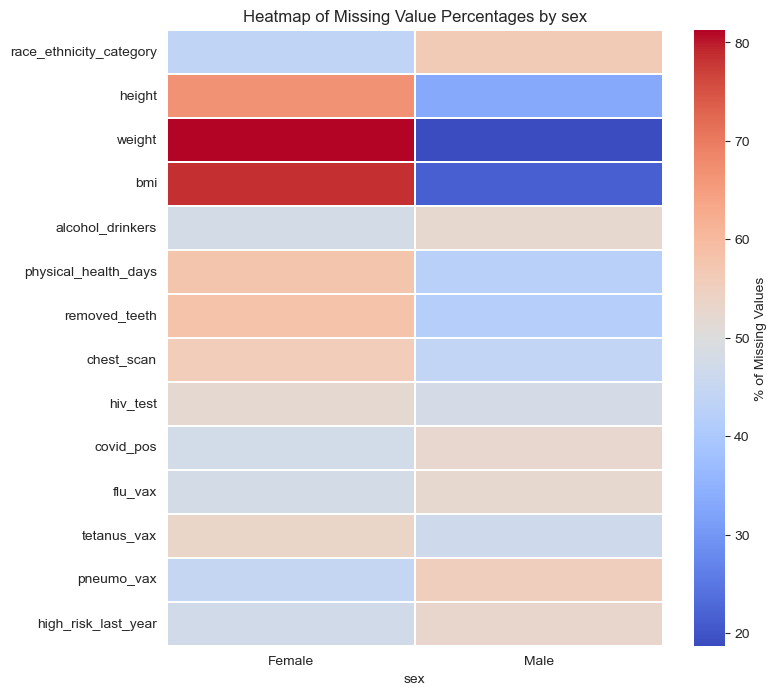

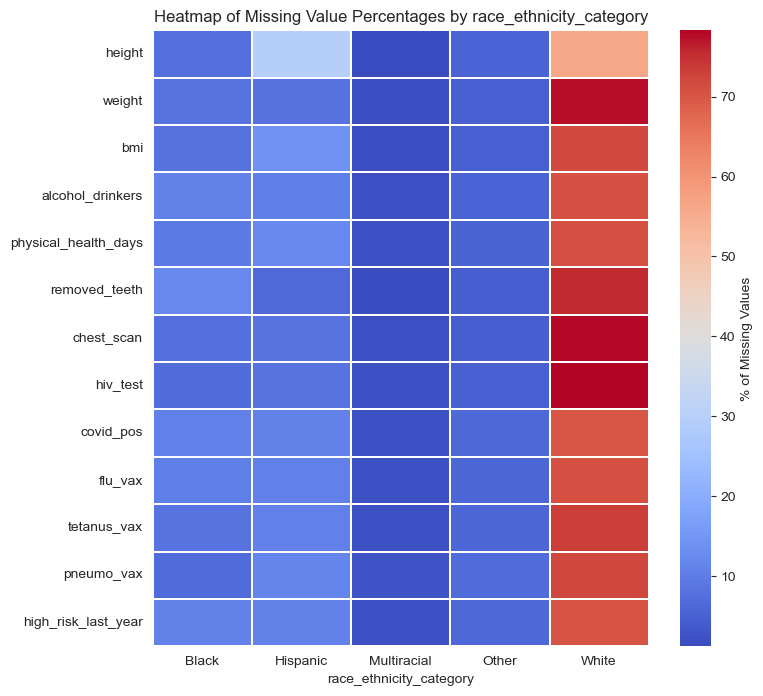

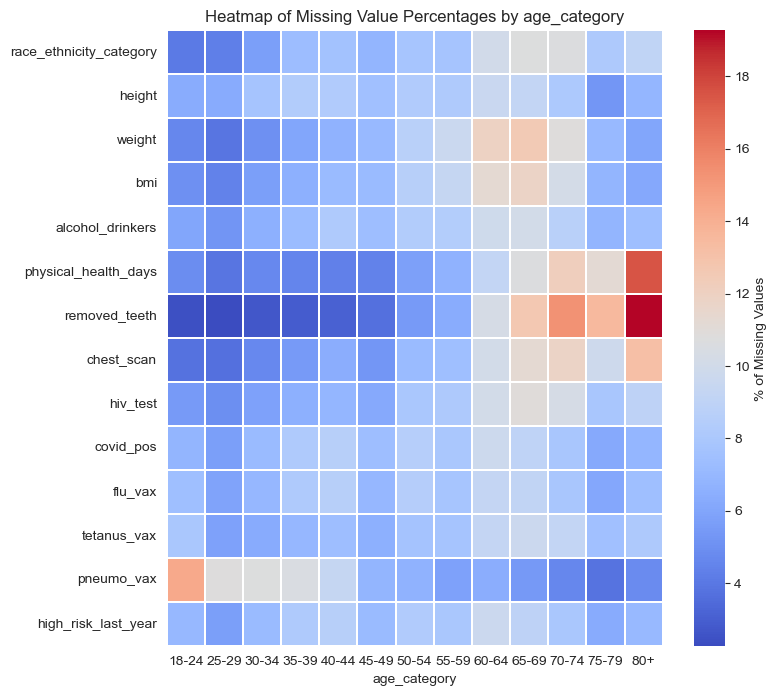

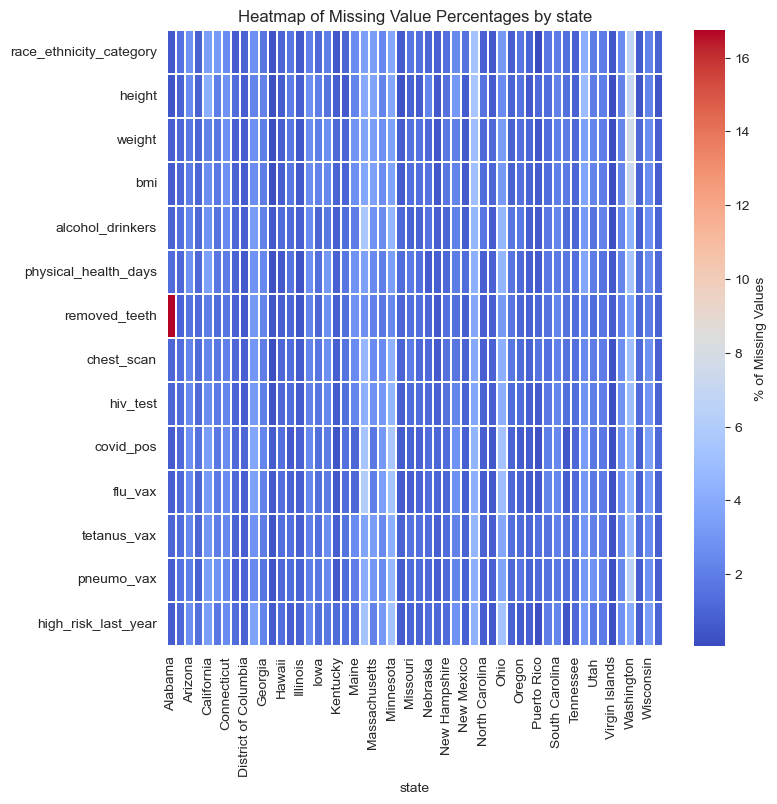

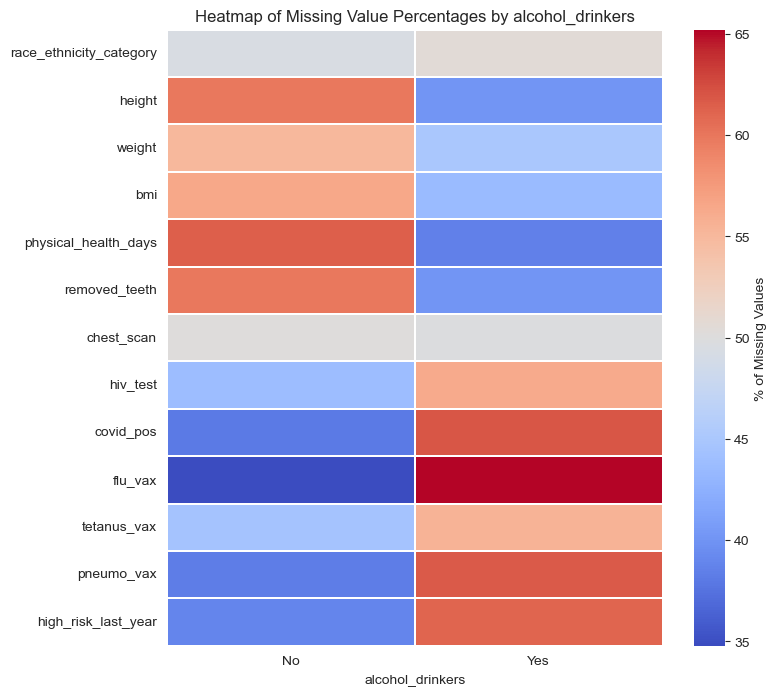

...

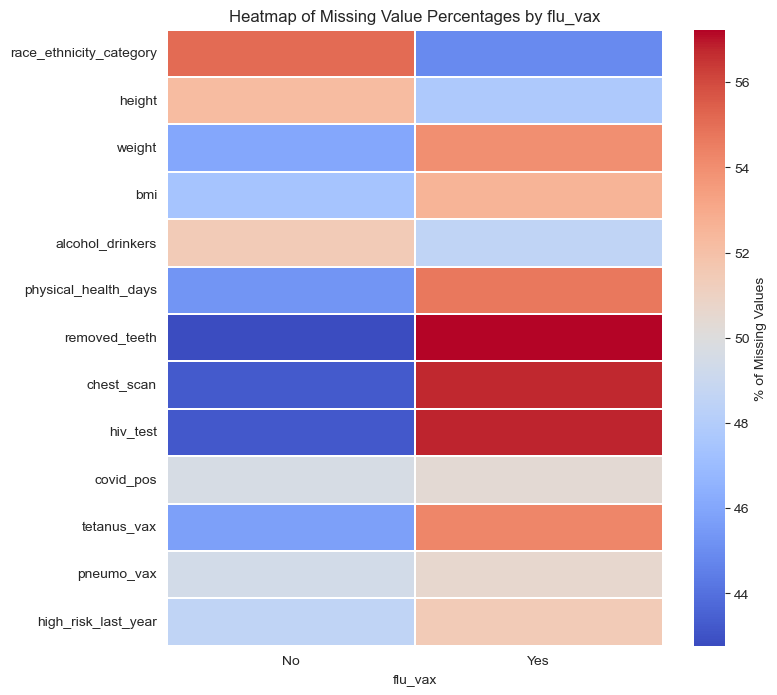

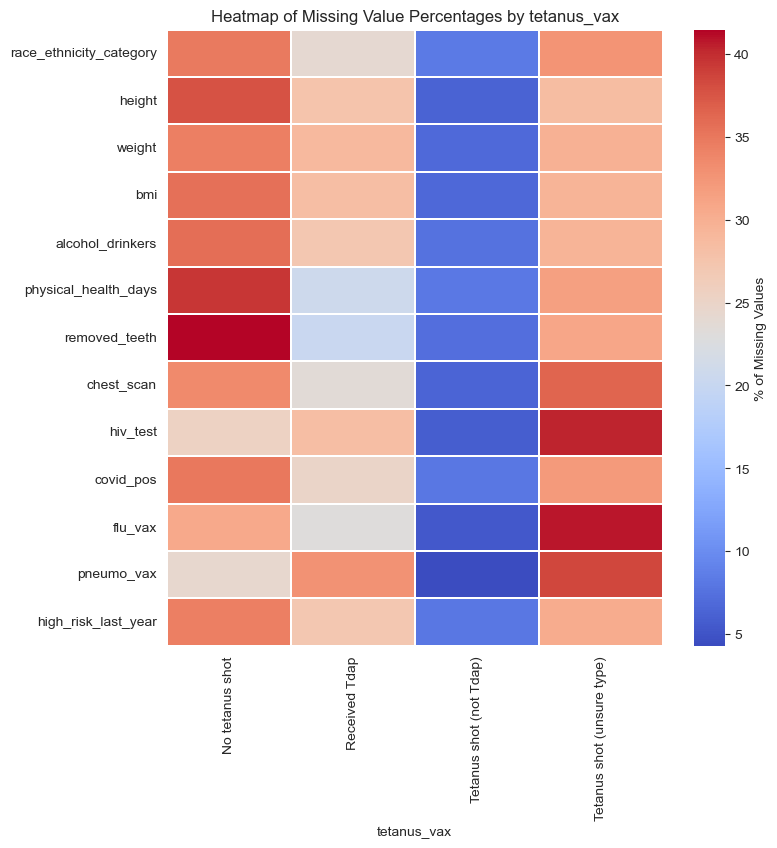

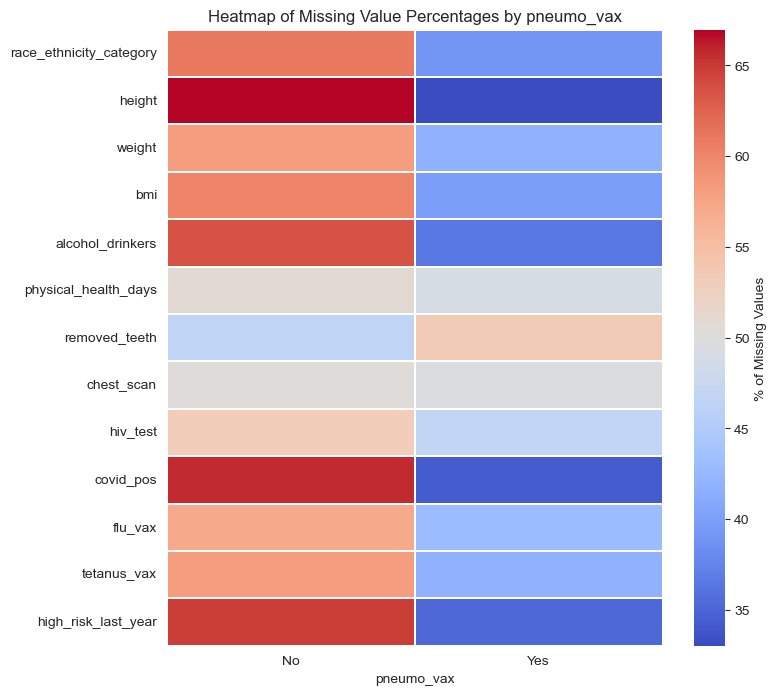

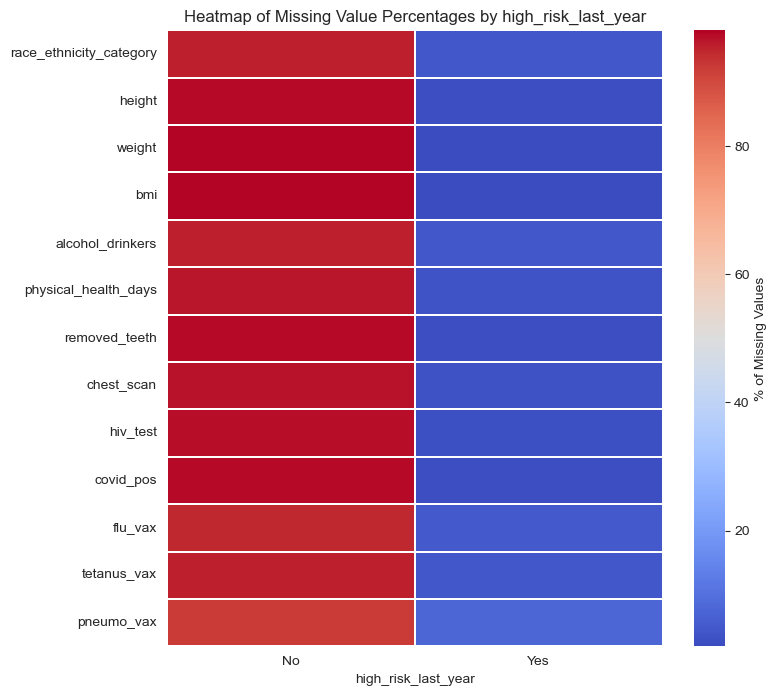

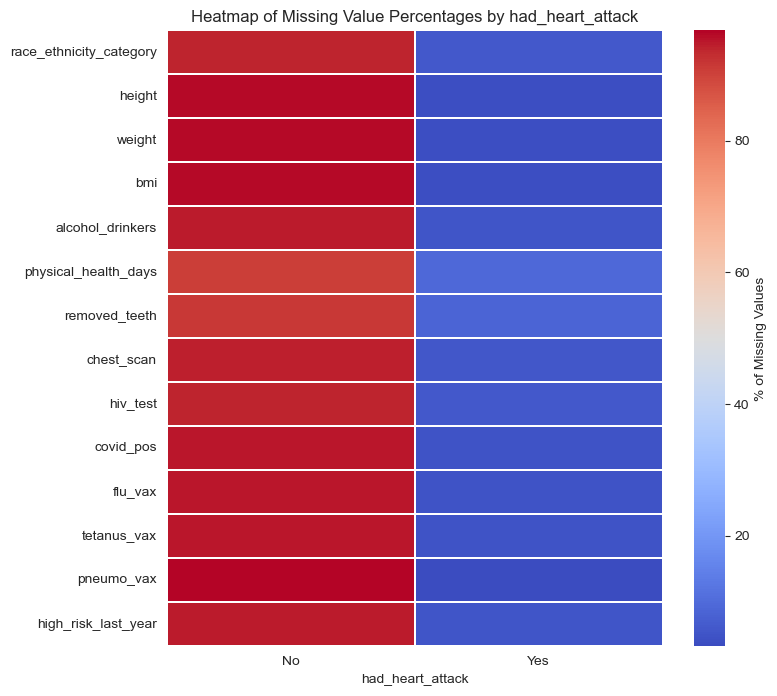

In [70]:
# loop over each varible in categorical columns:
for col in cat_cols:

    # create a table that stores the count of missing values for each column (columns without missing values and col itself are excluded)
    # use groupby for to breakdown col into each categories
    missing_counts_tb = heart_attack_clean.groupby(col)[[nan_col for nan_col in nan_cols if nan_col != col]].apply(lambda x: x.isnull().sum())

    # convert the count to percentage of total missing values within the column
    missing_counts_pct = (missing_counts_tb.div(missing_counts_tb.sum(axis=0), axis=1)* 100).round(2)

    # draw a heatmap
    # x-axis: categories in col
    # y-axis: all columns that contain missing values excluding col
    # color: red one represents abnormal high percentage of specific category not answering the survey
    plt.figure(figsize=(8,8))
    sns.heatmap(missing_counts_pct.T, linewidths=0.2, cmap='coolwarm', cbar_kws={'label': '% of Missing Values'})
    plt.title(f'Heatmap of Missing Value Percentages by {col}')

    plt.show()

**Takeaways**:
1. Females(`sex`) are more likely to have missing values in the `bmi` and `weight_in_kilograms` columns, possibly due to discomfort in sharing such information.
2. Respondents aged 80+ (`age_category`) tend to have more missing values on average, particularly in the `had_angina` column. **As noted in the Preliminary EDA**, those with missing values in had_angina have a significantly higher likelihood of experiencing a heart attack, providing context for these observations.
3. Not many realistic insights can be driven, more EDA should be performed on seeking the best method for fixing missing values.

---



#### In-Deph Feature Analysis <a class="anchor" id="5a"></a>

#### 1. `height`

From the preliminary EDA of `height`, we know that height has two frequent ranges. Based on the intuition, I assume height is dependent of race, gender,ages, so I will create four plots to discover relevant information:
1. A boxplot of `height` vs `sex` 
2. Overlapping histograms of `height` for males and females represented in the `sex` column.
3. Bar charts showing the percentage difference in `height` compared to the mean across different groups in `race_ethnicity_category`.
4. Bar charts showing the percentage difference in `height` compared to the mean across different groups in `age_category`.

In [71]:
# obtain a sorted list of age categories for enhanced visual presentation
age_categories = [age for age in heart_attack_clean['age_category'].unique() if pd.isna(age) == False]
age_categories = sorted(age_categories)

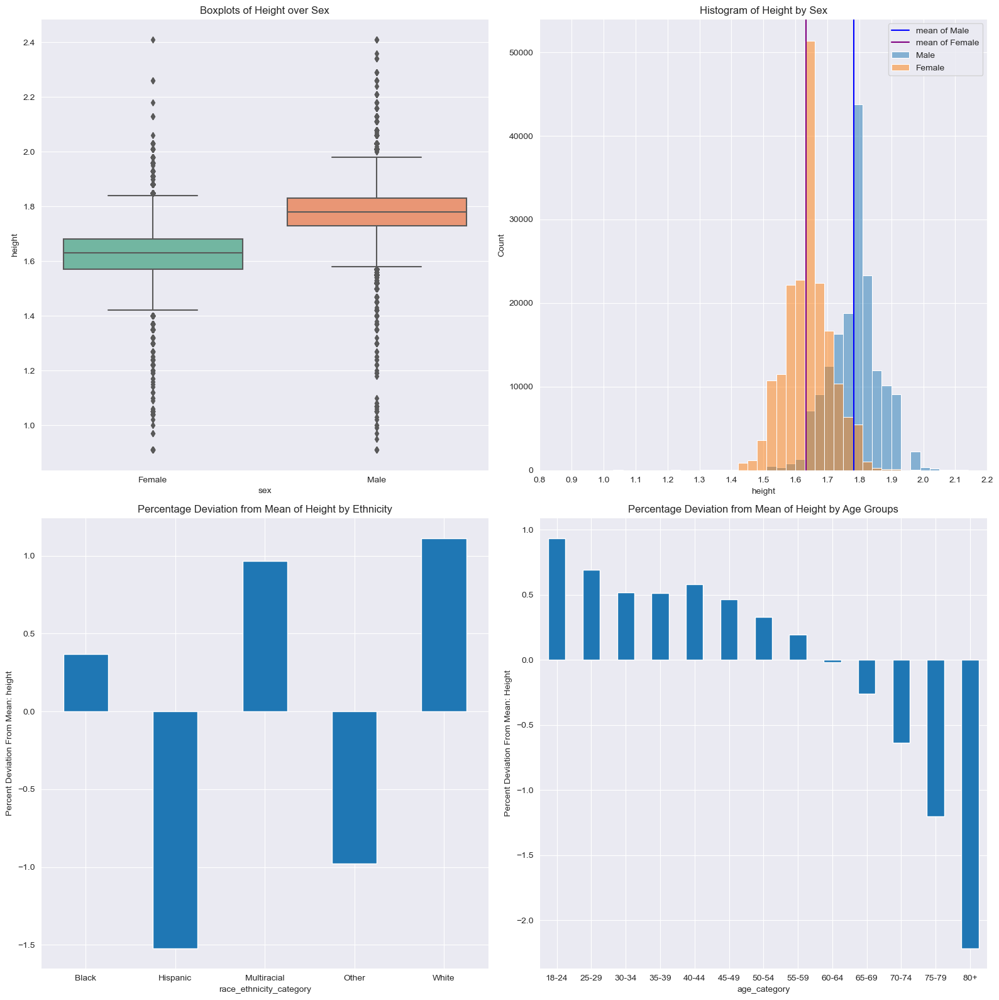

In [72]:
# draw a subplot with three subplots
fig, ax = plt.subplots(2, 2, figsize=(16,16))

# first plot: create the boxplot of Height over sex
sns.boxplot(
            x='sex',
            y='height',
            data=heart_attack_clean,
            palette='Set2',
            ax=ax[0, 0]
            )
ax[0, 0].set_title('Boxplots of Height over Sex')


                       
# second plot: create overlapped histograms of Height by Male and Female
# create the histogram of Male height, and create a line of Male height mean
sns.histplot(
             data=heart_attack_clean[heart_attack_clean['sex'] == 'Male'], 
             x='height', 
             bins=50,
             alpha=0.5, 
             label='Male',
             ax=ax[0, 1]
)
ax[0, 1].axvline(
            heart_attack_clean[heart_attack_clean['sex'] == 'Male']['height'].mean(), 
            label='mean of Male',
            color='blue',
)


# create the histogram of Female height, and create a line of Female height mean
sns.histplot(
            data=heart_attack_clean[heart_attack_clean['sex'] == 'Female'], 
            x='height', 
            bins=50,
            alpha=0.5,
            label='Female',
            ax=ax[0, 1]
)
ax[0, 1].axvline(
            heart_attack_clean[heart_attack_clean['sex'] == 'Female']['height'].mean(), 
            label='mean of Female',
            color='purple',
)

ax[0, 1].set_title('Histogram of Height by Sex')
ax[0, 1].set_xlim(0.8, 2.2)
ax[0, 1].set_xticks(np.arange(0.8, 2.3, 0.1))
ax[0, 1].legend()



# third plot, plot percent deviation from mean of Height for each Ethnicity
# create height_race_mean and height_race_mean_diff table.
height_race_mean = heart_attack_clean.groupby('race_ethnicity_category')['height'].mean()
height_race_mean_diff = (height_race_mean - height_race_mean.mean()) / height_race_mean * 100

height_race_mean_diff.plot(kind='bar', ax=ax[1, 0])
ax[1, 0].set_title('Percentage Deviation from Mean of Height by Ethnicity')
ax[1, 0].set_ylabel('Percent Deviation From Mean: height')
ax[1, 0].tick_params(axis='x', rotation=0)



# fourth plot, plot percent deviation from mean of Height for each Age category
# create height_age_mean and height__age_mean_diff table.
height_age_mean = heart_attack_clean.groupby('age_category')['height'].mean()
height_age_mean_diff = (height_age_mean - height_age_mean.mean()) / height_age_mean * 100
height_age_mean_diff = height_age_mean_diff.loc[age_categories, ]

height_age_mean_diff.plot(kind='bar', ax=ax[1, 1])
ax[1, 1].set_title('Percentage Deviation from Mean of Height by Age Groups')
ax[1, 1].set_ylabel('Percent Deviation From Mean: Height')
ax[1, 1].tick_params(axis='x', rotation=0)


plt.tight_layout()
plt.show()

**Takeaways:**
1. **Male and Female have very different distribution in `height`**:  The average height for 'Male' is close to 1.8 meters, while the average for 'Female' is slightly over 1.6 meters.
2. Height appears to have more subtle relationship with `race_ethnicity_group` and `age_group`. All the percent deviations from the mean fall between -1.5%-1.5% except the group of age 80+. Considering that the average height is around 1.7 meters, the absolute deviation is approximately 0.025 meters, which is relatively insignificant.
3. Thus, `sex` will be utilized to impute missing values in `height`. As both males and females show a normal distribution in height, I will assign the mean height values based on gender to the missing entries.
___

#### 2. `weight`
 - From the previous EDA observations, `weight` appears to have a normal distribution with slightly right skewed. 
 - Similarly, I assume weight is dependent of race, gender, and ages, so I will create four plots to discover relevant information:
    1. A boxplot of `weight` vs `sex` 
    2. Overlapping histograms of `weight` for males and females represented in the `sex` column.
    3. Bar charts showing the percentage difference in `weight` compared to the mean across different groups in `race_ethnicity_category`.
    4. Bar charts showing the percentage difference in `weight` compared to the mean across different groups in `age_category`.

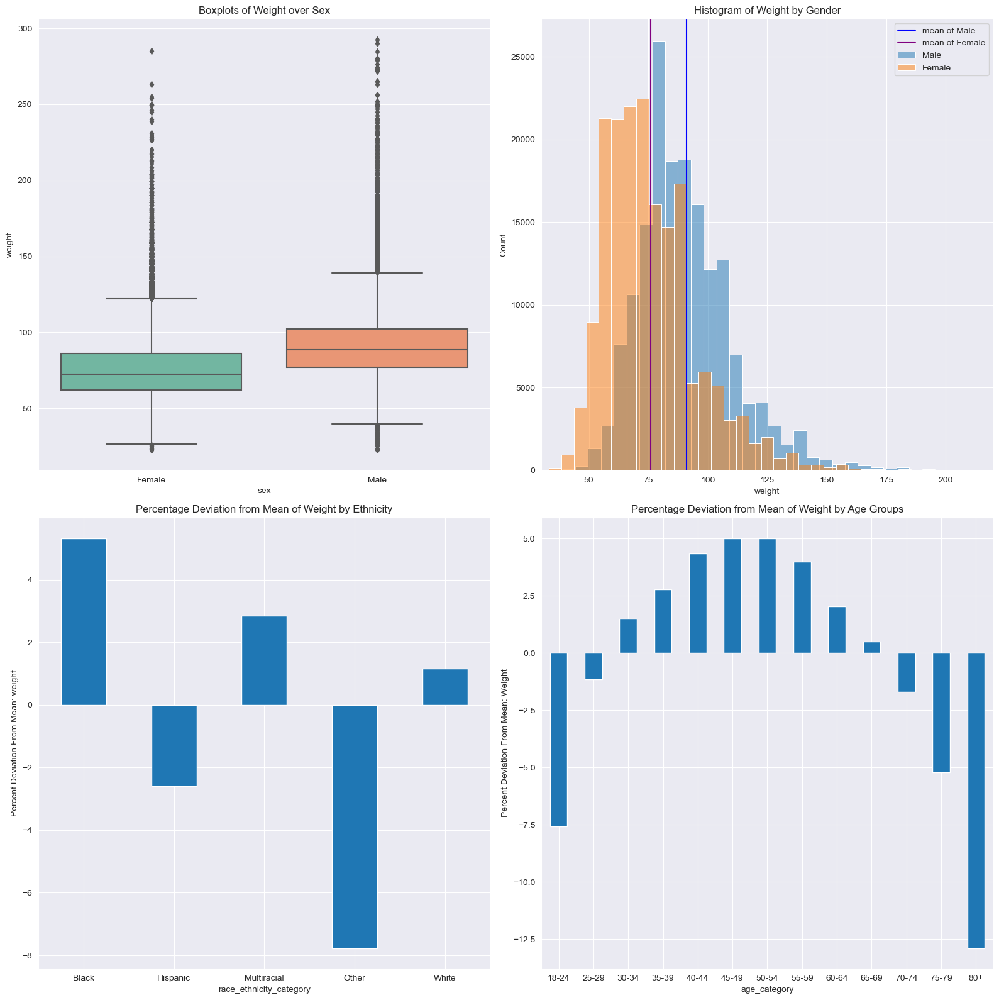

In [73]:
# draw a subplot with three subplots
fig, ax = plt.subplots(2, 2, figsize=(16,16))

# first plot: create the boxplot of weight over sex
sns.boxplot(
            x='sex',
            y='weight',
            data=heart_attack_clean,
            palette='Set2',
            ax=ax[0, 0]
            )
ax[0, 0].set_title('Boxplots of Weight over Sex')


                       
# second plot: create overlapped histograms of weight by Male and Female
# create the histogram of Male weight, and create a line of Male weight mean
sns.histplot(
             data=heart_attack_clean[heart_attack_clean['sex'] == 'Male'], 
             x='weight', 
             bins=50,
             alpha=0.5, 
             label='Male',
             ax=ax[0, 1]
)
ax[0, 1].axvline(
            heart_attack_clean[heart_attack_clean['sex'] == 'Male']['weight'].mean(), 
            label='mean of Male',
            color='blue',
)


# create the histogram of Female weight, and create a line of Female weight mean
sns.histplot(
            data=heart_attack_clean[heart_attack_clean['sex'] == 'Female'], 
            x='weight', 
            bins=50,
            alpha=0.5,
            label='Female',
            ax=ax[0, 1]
)
ax[0, 1].axvline(
            heart_attack_clean[heart_attack_clean['sex'] == 'Female']['weight'].mean(), 
            label='mean of Female',
            color='purple',
)

ax[0, 1].set_title('Histogram of Weight by Gender')
ax[0, 1].set_xlim(30, 220)
ax[0, 1].legend()



# third plot, plot percent deviation from mean of weight for each Ethnicity
# create weight_race_mean and weight_race_mean_diff table.
weight_race_mean = heart_attack_clean.groupby('race_ethnicity_category')['weight'].mean()
weight_race_mean_diff = (weight_race_mean - weight_race_mean.mean()) / weight_race_mean * 100

weight_race_mean_diff.plot(kind='bar', ax=ax[1, 0])
ax[1, 0].set_title('Percentage Deviation from Mean of Weight by Ethnicity')
ax[1, 0].set_ylabel('Percent Deviation From Mean: weight')
ax[1, 0].tick_params(axis='x', rotation=0)



# fourth plot, plot percent deviation from mean of weight for each Age category
# create weight_age_mean and weight__age_mean_diff table.
weight_age_mean = heart_attack_clean.groupby('age_category')['weight'].mean()
weight_age_mean_diff = (weight_age_mean - weight_age_mean.mean()) / weight_age_mean * 100
weight_age_mean_diff = weight_age_mean_diff.loc[age_categories, ]

weight_age_mean_diff.plot(kind='bar', ax=ax[1, 1])
ax[1, 1].set_title('Percentage Deviation from Mean of Weight by Age Groups')
ax[1, 1].set_ylabel('Percent Deviation From Mean: Weight')
ax[1, 1].tick_params(axis='x', rotation=0)


plt.tight_layout()
plt.show()

**Takeaways:**
1. **Male and Female have very different average `weight`** values.
2. The `weight` distribution for both Male and Female is approximately normal but slightly right-skewed.
3. The mean `weight` varies among different races. 
4. The `weight` of respondents in the age ranges of 18-24, 45-49, 50-54, 75-79, and 80+ deviates notably from the overall mean.
3. Therefore, `sex`, `race_ethnicity_group`, `age_category` all appear to be correlated with `weight`. Given that there are over 2% missing values in `race_ethnicity_group`, I will impute `weight` using `sex` and `age_category`.
___

#### 3. `physical_health_days`
`physical_health_days` is defined as the number of days with poor physical health in the past 30 days. From the preliminary EDA observation, `physical_health_days` appears to have correlation with `mental_health_days` since these two variables exhibit similar distribution. I will first explore the linear correlation between these two variables. 

In [74]:
# plot the correlation heatmap between numeric columns
corr_matrix = heart_attack_clean.corr(numeric_only=True)
corr_matrix.style.background_gradient(cmap="coolwarm")

,height,weight,bmi,sleep_hours,physical_health_days,mental_health_days
height,1.000000,0.471475,-0.031014,-0.013415,-0.050239,-0.052903
weight,0.471475,1.000000,0.857049,-0.055913,0.074348,0.040034
bmi,-0.031014,0.857049,1.000000,-0.054054,0.113916,0.077857
sleep_hours,-0.013415,-0.055913,-0.054054,1.000000,-0.055899,-0.127524
physical_health_days,-0.050239,0.074348,0.113916,-0.055899,1.000000,0.306664
mental_health_days,-0.052903,0.040034,0.077857,-0.127524,0.306664,1.000000


**Takeaways:**
- The correlation between `physical_health_days` and `mental_health_days` is 0.31, indicating a weak linear relationship. Therefore, they are not suitable for imputing missing values for one another.
- Based on the definition of `physical activities` and `general_health`, there appears to be a correlation with `physical_health_days`. Individuals who participated in physical activities in the past month and those who rated their health as very good or excellent tend to have lower values in `physical_health_days`.

In [75]:
heart_attack_clean['general_health'].unique()

array(['Very good', 'Fair', 'Poor', 'Good', 'Excellent'], dtype=object)

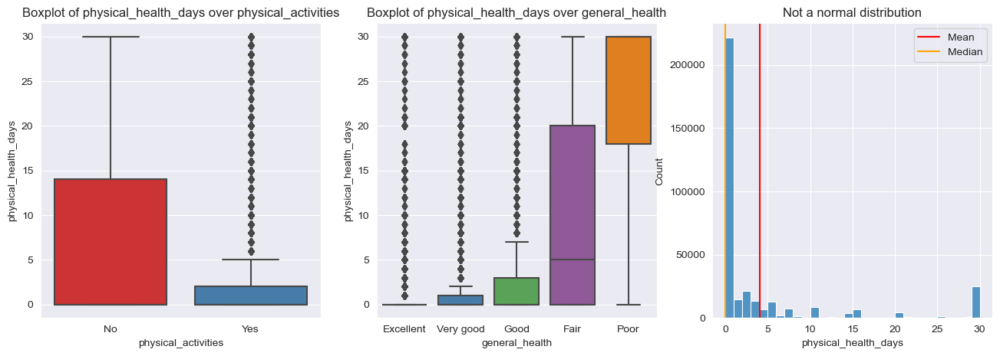

In [76]:
# draw a subplot with two subplots
fig, ax = plt.subplots(1, 3, figsize=(16,5))
                       
# boxplot of physical_health_days over physical activities
sns.boxplot(
            x='physical_activities',
            y='physical_health_days',
            data=heart_attack_clean,
            palette='Set1',
            ax=ax[0]
)
ax[0].set_title('Boxplot of physical_health_days over physical_activities')
                       

# boxplot of physical_health_days over general health                       
sns.boxplot(
            x='general_health',
            y='physical_health_days',
            data=heart_attack_clean,
            palette='Set1',
            ax=ax[1],
            order = ['Excellent', 'Very good', 'Good', 'Fair', 'Poor']
)
ax[1].set_title('Boxplot of physical_health_days over general_health')


# recap on the distribution of physical_health_days
sns.histplot(heart_attack_clean['physical_health_days'], bins=30, ax=ax[2])
ax[2].axvline(x=heart_attack_clean['physical_health_days'].mean(), color='red', label='Mean')
ax[2].axvline(x=heart_attack_clean['physical_health_days'].median(), color='orange', label='Median')   
ax[2].set_title('Not a normal distribution')
ax[2].legend()
                 
plt.show()

**Takeaways:**
1. `physical_health_days`  appears to correlate with `physical_activities`: Individuals who did not engage in exercise over the past month tend to report a higher number of poor physical health days.
2. A clear correlation exists between `physical_health_days` and `general_health`: Respondents who consider themselves healthier report fewer poor physical health days.
3. `general_health` seems to be a better fit for imputing missing values in `physical_health_days`: The distinction among groups in general_health is quite pronounced. Given that `physical_health_days` is extremely right-skewed and is a discrete variable, I will use the median to impute missing values based on the corresponding categories in general_health.


In [77]:
# Check the median of physical_health_days for each category in general_health
heart_attack_clean.groupby('general_health')['physical_health_days'].agg('median')

general_health
Excellent     0.0
Fair          5.0
Good          0.0
Poor         30.0
Very good     0.0
Name: physical_health_days, dtype: float64

In [78]:
# Check the median of physical_health_days for each category in physical_activities
heart_attack_clean.groupby('physical_activities')['physical_health_days'].agg('median')

physical_activities
No     0.0
Yes    0.0
Name: physical_health_days, dtype: float64

- By comparing the median of each category within `general_health` and `physical_activities`,  `general_health` appears to be a better solution.
---

#### 4. `removed_teeth`

My intuition is that when age increases, they tend to have more removed_teeth, so this equates respondents with `age_category` 75-79 or 80+ may have higher percentage of '6+' `removed_teeth` compared to respondents in 18-24 and 25-29 age groups.

<Figure size 1400x600 with 0 Axes>

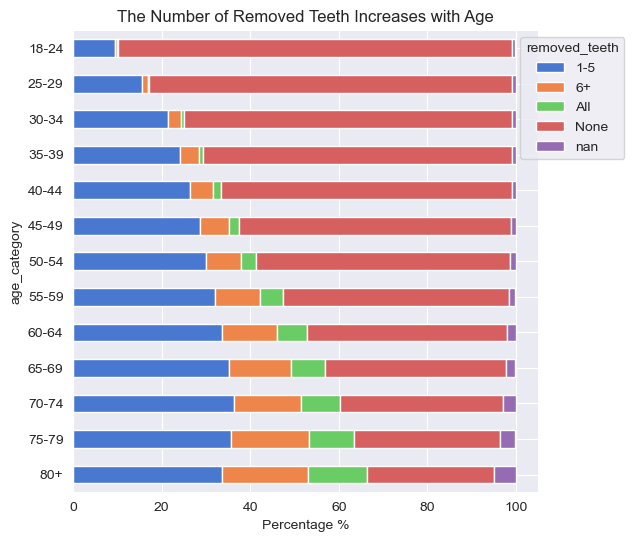

In [79]:
# create a cross_table with the count of each age_cagegory to removed_teeth
cross_tb_age_teeth = pd.crosstab(heart_attack_clean['age_category'], heart_attack_clean['removed_teeth'], dropna=False)

# use cross_table.sum(axis)=1 to find the sum of each category,
# use div, with axis=0 on the above results to find the percentage of each removed_teeth category by age_group
# use round to 1 decimal point, and sort_values for aesthetic purpose
pct_tb_age_teeth = ((cross_tb_age_teeth.div(cross_tb_age_teeth.sum(axis=1), axis=0) * 100)
                    .round(1)
                    .sort_values(by='None', )
                    )
pct_tb_age_teeth

# # create a stacked-barplot showing the percentage of removed_teeth in each age group
plt.figure(figsize=(14, 6))
pct_tb_age_teeth.plot(kind='barh', stacked=True, color=palette)
plt.title('The Number of Removed Teeth Increases with Age')
plt.xlabel('Percentage %')
plt.legend(title='removed_teeth', loc='upper right', bbox_to_anchor=(1.2, 1))

plt.show()

**Takeaways:**
1. The graph is consistent with my assumption: a higher percentage of '1-5' or '6+' removed teeth percentages can be found in repondents with higher ages.
2. It seems that imputing missing values in `removed_teeth` with the mode based on age groups in `age_category` is quite reasonable. I will check the mode for each group first.

In [80]:
# get the mode of removed teech for each age group
heart_attack_clean.groupby('age_category')['removed_teeth'].agg(pd.Series.mode)

age_category
18-24    None
25-29    None
30-34    None
35-39    None
40-44    None
45-49    None
50-54    None
55-59    None
60-64    None
65-69    None
70-74    None
75-79     1-5
80+       1-5
Name: removed_teeth, dtype: object

- The results are consistent with findings with the plot and takeaways, so  `age_category` will be used to impute missing values in `removed_teeth`
---

#### 5. `high_risk_last_year`

- This variable stores the answers if the respondent fits the condition listed in the survey question: 'You have injected any drug other than those prescribed for you in the past year. You have been treated for a sexually transmitted disease or STD in the past year. You have given or received money or drugs in exchange for sex in the past year'. 
- Based on business sense, not many variables seem in this dataset appear to have other than `sex`, I will create visuals to check if any insights can be driven from this graph.

In [81]:
# get the cross table to of the count of observations by sex and high_risk_last_year
cross_tb_hr_sex = pd.crosstab(heart_attack_clean['sex'], heart_attack_clean['high_risk_last_year'], dropna=False)

# get the percentage table of % of male/female within each category in 
pct_tb_hr_sex = (cross_tb_hr_sex.div(cross_tb_hr_sex.sum(axis=1), axis=0) * 100).round(1)

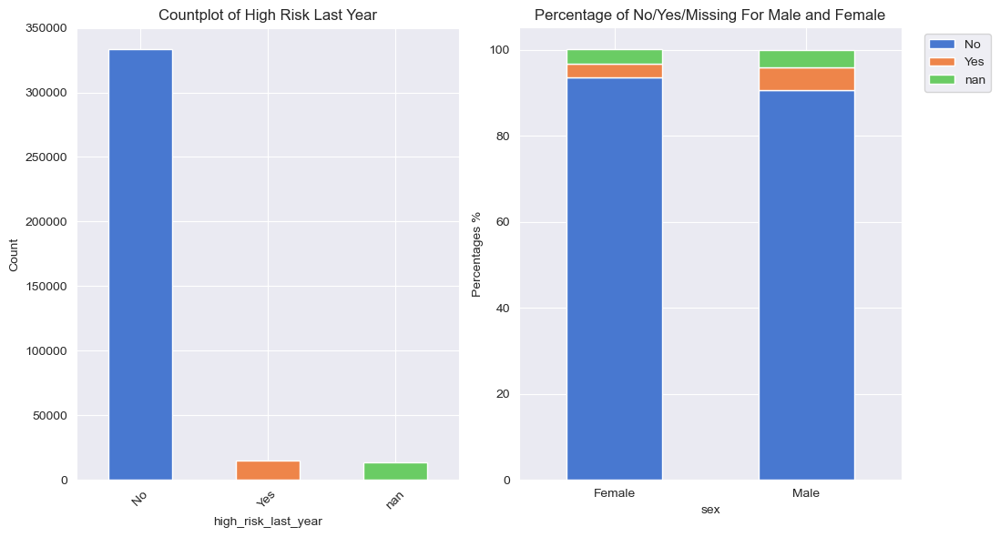

In [82]:
fig, ax = plt.subplots(1, 2, figsize=(11, 6))

# quick recap on the countplot of high_risk_last_year
cross_tb_hr_sex.sum(axis=0).plot(kind='bar', color=palette, ax=ax[0])
ax[0].set_title(f'Countplot of High Risk Last Year')
ax[0].set_ylabel('Count')
ax[0].tick_params(axis='x', rotation=45)


# plot the stack bar to show perentage of gender across different responese to high_risk_last_year
pct_tb_hr_sex.plot(kind='bar', stacked=True, color=palette, ax=ax[1])
ax[1].set_title('Percentage of No/Yes/Missing For Male and Female')
ax[1].set_ylabel('Percentages %')
ax[1].tick_params(axis='x', rotation=0)
ax[1].legend(loc='upper right', bbox_to_anchor=(1.25, 1))



plt.tight_layout()
plt.show()

Takeaways:
1. Very imbalanced distrbution within the `high_rist_last_year`.
2. Both female and male have a similar distribution in answers to the question `high_risk_last_year`, they all have a strong tendency of choosing 'No'
3. I will impute the missing values in `high_risk_last_year` with the predominant responst 'No' as it reflects the majority opinion. This will ensures that the imputed values align with the overall population trend, minizing the introduction of bias.
___

#### Summary:
1. Impute missing values in `height` based on mean height values of each gender in `sex` column.
2. Impute missing values in `weight` with `sex` and `age_category`.
3. Missing values in `bmi` can calculated with imputed `height` and `weight`.
4. Impute missing values in `physical_health_days` with the median of each category in `general_health`.
5. Impute missing values in `removed_teeth` with the mode of each age range in `age_category`.
6. Impute missing values in `high_risk_last_year` with 'No'.

___


## 6. Data Preprocessing - Stage 2 <a class="anchor" id="6"></a>


### 6.1 Dealing with Missing Values - Stage 2 <a class="anchor" id="6a"></a>

This section is dedicatied to combine the insights and conclustions from previous sections and fix the remaining missing values.

In [83]:
# Existng features that contain missing values
heart_attack_clean.isna().mean().loc[lambda x: x > 0].sort_values() * 100

physical_health_days        1.446565
height                      1.650730
removed_teeth               1.919820
race_ethnicity_category     2.288368
alcohol_drinkers            2.534803
flu_vax                     2.795881
high_risk_last_year         3.689348
covid_pos                   3.740182
weight                      4.459873
chest_scan                  4.650501
bmi                         5.154146
hiv_test                    7.166242
pneumo_vax                  9.843602
tetanus_vax                10.908910
dtype: float64

To be continued.